In [1]:
import tcri 
import scanpy as sc
import grimoire as spell
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os

preprocessed = "/Users/nceglia/Data/tcri/yost/combined_processed.h5ad"

if not os.path.exists(preprocessed):
    adata = sc.read("/Users/nceglia/Data/tcri/yost/combined.h5ad")

    ct = []
    for x in adata.obs["cell.id"]:
        if "scc" in x:
            ct.append("scc")
        else:
            ct.append("bcc")
    adata.obs["cancer"] = ct

    respo = []
    for x in adata.obs["response"]:
        if "yes" in x.lower():
            respo.append("Yes")
        else:
            respo.append("No")
    adata.obs["response"] = respo

    sc.tl.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    adata.write(preprocessed)
else:
    print("Reading...")
    adata = sc.read(preprocessed)
prob_cols = []
for x in adata.obs.columns:
    if "prob" in x:
        print(x)
        prob_cols.append(x)
adata.uns["probability_columns"] = prob_cols

Reading...
CD8_ex Pseudo-probability
CD8_act Pseudo-probability
CD8_ex_act Pseudo-probability
CD8_mem Pseudo-probability
CD8_eff Pseudo-probability
Tregs Pseudo-probability
Tfh Pseudo-probability
Th17 Pseudo-probability
Naive Pseudo-probability
CD8_naive Pseudo-probability


In [2]:
tcri.pp.register_phenotype_key(adata,"genevector")
tcri.pp.register_clonotype_key(adata,"trb")
tcri.pp.clone_size(adata)

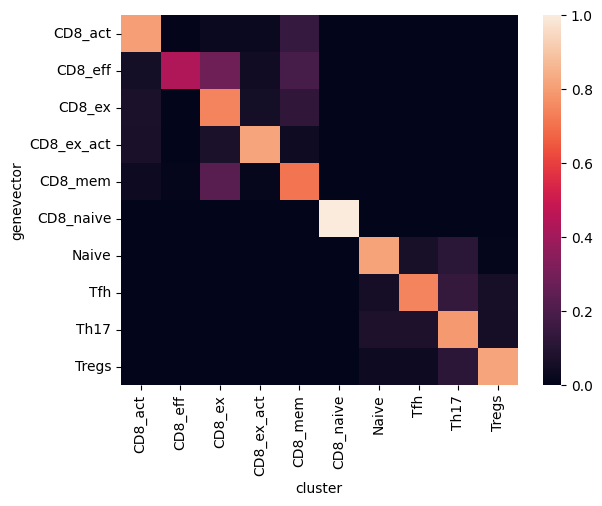

In [3]:
spell.pl.crosstab_heatmap(adata,"genevector","cluster")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/crosstab.pdf")

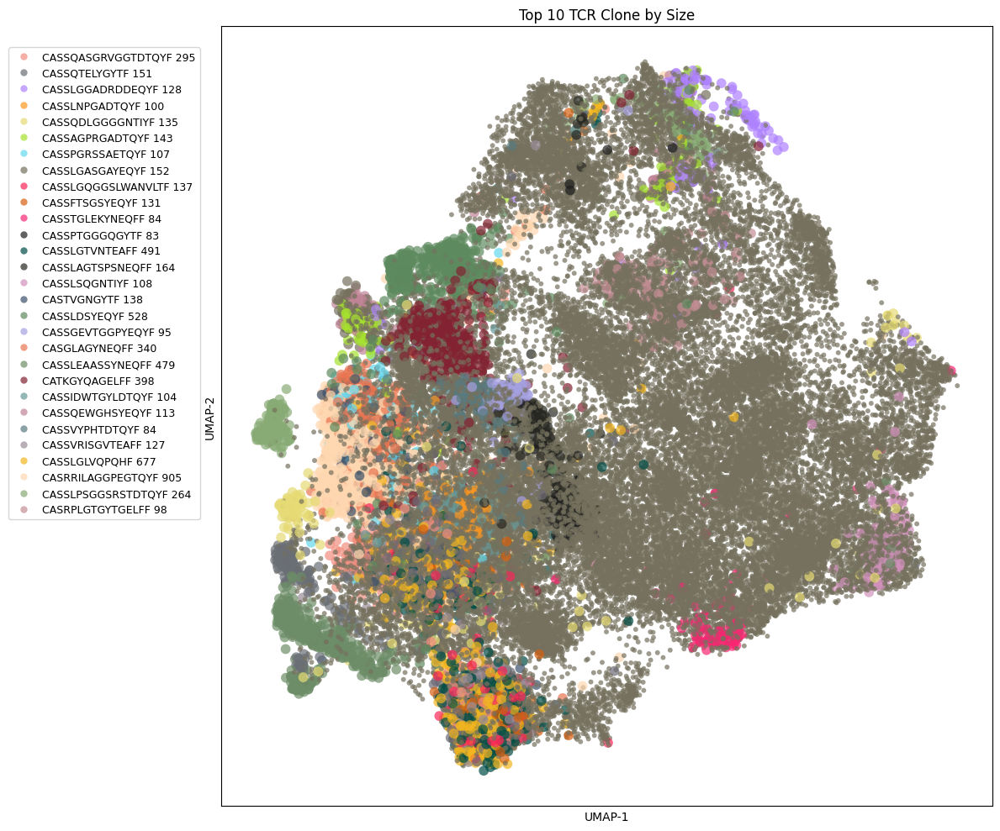

In [4]:
tcri.pl.clone_umap(adata,figsize=(12,10),top_n=30)
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/clones.pdf")

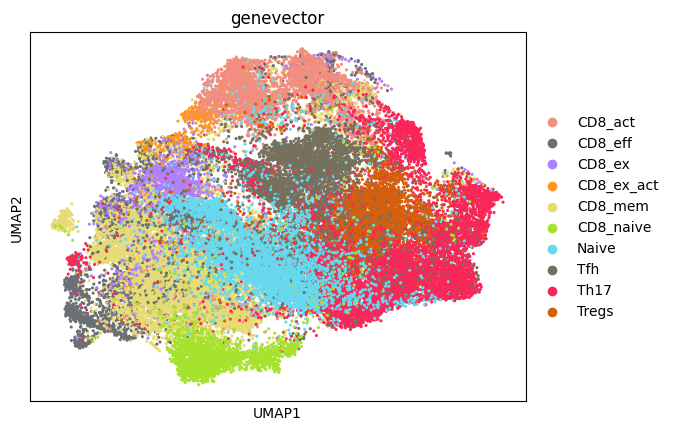

In [5]:
sc.pl.umap(adata,color="genevector",s=20,save="genevector_yost.pdf")
!cp figures/umapgenevector_yost.pdf /Users/nceglia/Data/tcri/yost/figures/

In [6]:
tcri.pp.joint_distribution(adata)

In [7]:
pentropy_table = "/Users/nceglia/Data/tcri/yost/pentropy_table.csv"
if os.path.exists(pentropy_table):
    df = pd.read_csv(pentropy_table)
else:
    clone = []
    entropy = []
    diffs = []
    timepoint = []
    resp = []
    big_clones=adata[adata.obs["clone_size"] > 5]
    for x in set(big_clones.obs["response"]):
        response = big_clones[big_clones.obs["response"] == x]
        for c in set(response.obs["trb"]):
            predata = response[response.obs["treatment"] == "pre"]
            preents = tcri.tl.phenotypic_entropies(predata)
            cldata = predata[predata.obs["trb"] == c]
            tcri.pp.joint_distribution(cldata)
            tpre = tcri.tl.phenotypic_entropy(cldata)
            postdata = response[response.obs["treatment"] == "post"]
            postents = tcri.tl.phenotypic_entropies(postdata)
            cldata = postdata[postdata.obs["trb"] == c]
            tcri.pp.joint_distribution(cldata)
            tpost = tcri.tl.phenotypic_entropy(cldata)
            if c in postents and c in preents:
                diff = postents[c] / preents[c]
                resp.append(x)
                entropy.append(diff)
                diffs.append(tpost / tpre)
                clone.append(c)
    df = pd.DataFrame.from_dict({"Clone":clone,"Response":resp, "Phenotypic Entropy":entropy, "Phenotypic Diff":diffs})
    df.to_csv(pentropy_table)
df

,Unnamed: 0,Clone,Response,Phenotypic Entropy,Phenotypic Diff
0,724,CASSLVLPGYTEAFF,No,-6.738956e+15,-6.738956e+15
1,620,CASVGQGEYEQYF,No,-5.824039e+15,-5.824039e+15
2,471,CAWSGLAGKTYNEQFF,No,-5.751724e+15,-5.751724e+15
3,450,CASSFLVTSYNEQFF,No,-5.498014e+15,-5.498014e+15
4,601,CASSPGMYGYTF,No,-5.311543e+15,-5.311543e+15
...,...,...,...,...,...
744,290,CASSFQWNEQFF,Yes,1.295803e+01,1.295803e+01
745,320,CASSYSTPAFRGISYEQYF,Yes,1.324807e+01,1.324807e+01
746,179,CASSPPYTF,Yes,1.429156e+01,1.429156e+01
747,607,CASSLVGRGQETQYF,No,4.308371e+01,4.308371e+01


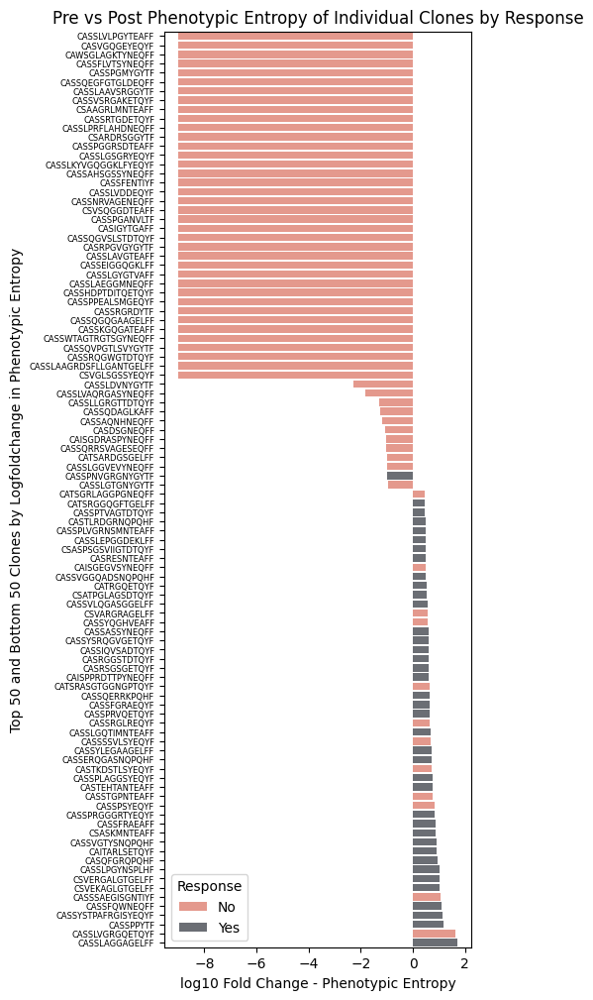

In [ ]:
df = df.sort_values("Phenotypic Entropy")
dfx = pd.concat([df.tail(50),df.head(50)])
dfx = dfx.sort_values("Phenotypic Entropy")
dfx['Phenotypic Entropy'] = dfx['Phenotypic Entropy'].clip(lower=00.000000001)
dfx["Phenotypic Entropy"] = np.log10(dfx["Phenotypic Entropy"])
plt.figure(figsize=(4, 12))
barplot = sns.barplot(x='Phenotypic Entropy', y='Clone', hue='Response', data=dfx, dodge=False)
barplot.set_yticklabels(barplot.get_yticklabels(), fontsize=6)
plt.xlabel('log10 Fold Change - Phenotypic Entropy')
plt.ylabel('Top 50 and Bottom 50 Clones by Logfoldchange in Phenotypic Entropy')
plt.title('Pre vs Post Phenotypic Entropy of Individual Clones by Response')
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/pentropy_clones.pdf")

## SCC NR Clones

Text(0.5, 1.0, 'SCC CD8 -  Phenotypic Entropy')

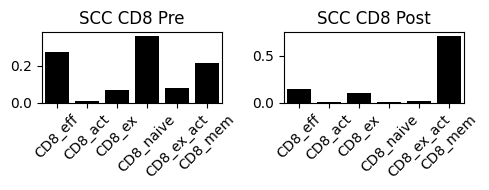

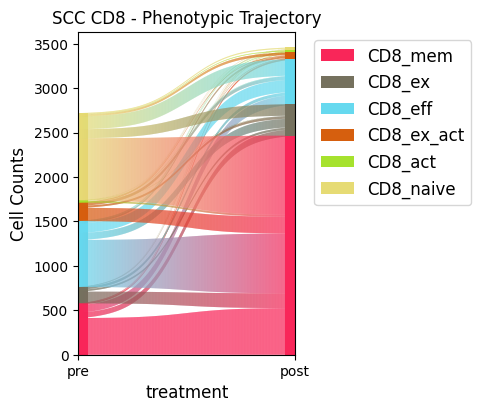

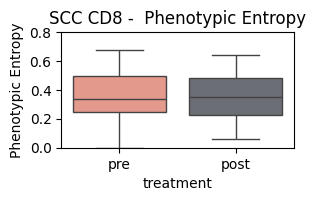

In [9]:
# nrclones = df[df["Phenotypic Entropy"] < 0]["Clone"].tolist()
# xdata = adata[adata.obs["trb"].isin(nrclones)]
xdata = adata[adata.obs["response"] == "No"]
xdata = xdata[xdata.obs["cancer"] == "scc"]
xdata = xdata[xdata.obs["disease"].isin(["scc_cd8","cd8_naive"])]
xdata = xdata[xdata.obs["clone_size"] > 20]
tcri.pp.joint_distribution(xdata)

cols = ['CD8_eff', 'CD8_act', 'CD8_ex', 'CD8_naive','CD8_ex_act', 'CD8_mem']

fig, ax = plt.subplots(1,2,figsize=(5,2))

zdata = xdata[xdata.obs["treatment"] == "pre"]
tcri.pp.joint_distribution(zdata)
pdist = tcri.tl.probability_distribution(zdata)

sns.barplot(data=pdist,ax=ax[0],order=cols,color="#000000")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=45)
ax[0].set_title("SCC CD8 Pre")

zdata = xdata[xdata.obs["treatment"] == "post"]
tcri.pp.joint_distribution(zdata)
total = zdata.uns["joint_distribution"].to_numpy().sum()
pdist = zdata.uns["joint_distribution"].sum(axis=1) / total

sns.barplot(data=pdist,ax=ax[1],order=cols,color="#000000")
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45)
ax[1].set_title("SCC CD8 Post")
fig.tight_layout()
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/pdist_scc_nr.pdf")

tcri.pp.joint_distribution(xdata)
phenotype_colors = dict(zip(set(xdata.obs[xdata.uns["tcri_phenotype_key"]]), tcri.pl.tcri_colors[4:]))

tcri.pl.phenotypic_flux(xdata,splitby="treatment",order=["pre","post"],nt=False,normalize=False,
                        phenotype_colors=phenotype_colors, figsize=(5,4), show_legend=True,
                        save="/Users/nceglia/Data/tcri/yost/figures/cd8_sankey_scc_nr.pdf")
plt.title("SCC CD8 - Phenotypic Trajectory")

tcri.pl.phenotypic_entropy(xdata,groupby="patient",splitby="treatment", save="/Users/nceglia/Data/tcri/yost/figures/pent_cd8_scc_nr.pdf", figsize=(3,1.5), order=["pre","post"])
plt.ylim(0,0.8)
plt.title("SCC CD8 -  Phenotypic Entropy")

## BCC NR Clones

Text(0.5, 1.0, 'BCC CD8 -  Phenotypic Entropy')

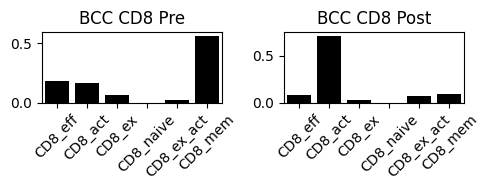

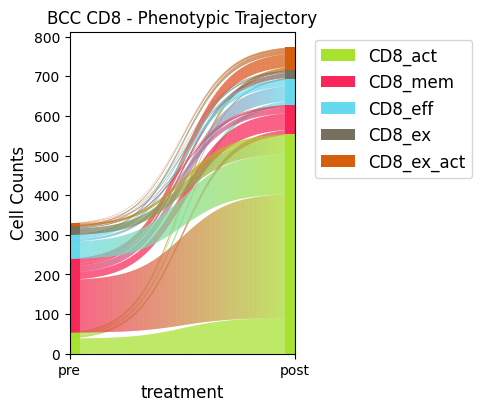

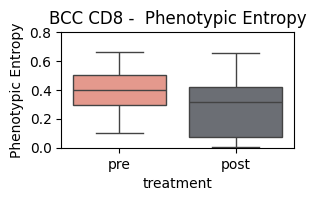

In [10]:
# nrclones = df[df["Phenotypic Entropy"] < 0]["Clone"].tolist()
# xdata = adata[adata.obs["trb"].isin(nrclones)]
xdata = adata[adata.obs["response"] == "No"]
xdata = xdata[xdata.obs["cancer"] == "bcc"]
xdata = xdata[xdata.obs["disease"].isin(["bcc_cd8","cd8_naive"])]
xdata = xdata[xdata.obs['clone_size'] > 20]

cols = ['CD8_eff', 'CD8_act', 'CD8_ex', 'CD8_naive','CD8_ex_act', 'CD8_mem']

fig, ax = plt.subplots(1,2,figsize=(5,2))

zdata = xdata[xdata.obs["treatment"] == "pre"]
pdist = tcri.tl.probability_distribution(zdata)

sns.barplot(data=pdist,ax=ax[0],order=cols,color="#000000")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=45)
ax[0].set_title("BCC CD8 Pre")

zdata = xdata[xdata.obs["treatment"] == "post"]
pdist = tcri.tl.probability_distribution(zdata)

sns.barplot(data=pdist,ax=ax[1],order=cols,color="#000000")
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45)
ax[1].set_title("BCC CD8 Post")
fig.tight_layout()
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/pdist_bcc_nr.pdf")

#phenotype_colors = dict(zip(set(xdata.obs[xdata.uns["tcri_phenotype_key"]]), tcri.pl.tcri_colors[4:]))

tcri.pl.phenotypic_flux(xdata,splitby="treatment",order=["pre","post"],nt=False,normalize=False,
                        phenotype_colors=phenotype_colors, figsize=(5,4),save="/Users/nceglia/Data/tcri/yost/figures/cd8_sankey_bcc_nr.pdf")
plt.title("BCC CD8 - Phenotypic Trajectory")


tcri.pp.joint_distribution(xdata)
tcri.pl.phenotypic_entropy(xdata,groupby="patient",splitby="treatment", save="/Users/nceglia/Data/tcri/yost/figures/pent_cd8_bcc_nr.pdf", figsize=(3,1.5))
plt.ylim(0,0.8)
plt.title("BCC CD8 -  Phenotypic Entropy")



Text(0.5, 1.0, 'BCC CD8 - Phenotypic Entropy (Responding Clones)')

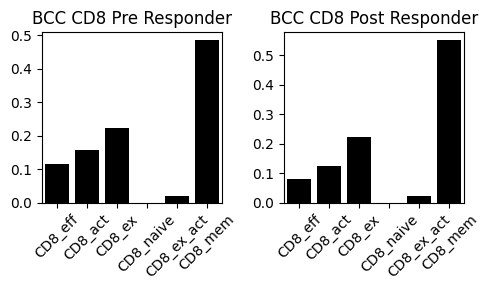

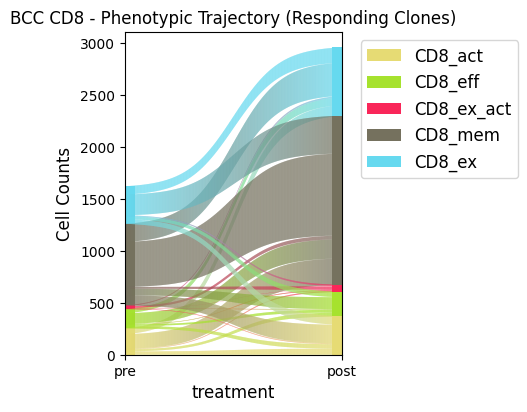

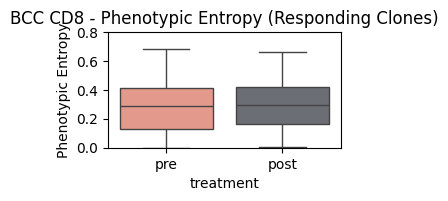

In [12]:
# nrclones = df[df["Phenotypic Entropy"] < 6]["Clone"].tolist()
# xdata = adata[adata.obs["trb"].isin(nrclones)]
xdata = adata[adata.obs["response"] == "Yes"]
xdata = xdata[xdata.obs["cancer"] == "bcc"]
xdata = xdata[xdata.obs["disease"].isin(["bcc_cd8","cd8_naive"])]

cols = ['CD8_eff', 'CD8_act', 'CD8_ex', 'CD8_naive','CD8_ex_act', 'CD8_mem']

fig, ax = plt.subplots(1,2,figsize=(5,3))

zdata = xdata[xdata.obs["treatment"] == "pre"]
tcri.pp.joint_distribution(zdata)
total = zdata.uns["joint_distribution"].to_numpy().sum()
pdist = zdata.uns["joint_distribution"].sum(axis=1) / total

sns.barplot(data=pdist,ax=ax[0],order=cols,color="#000000")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=45)
ax[0].set_title("BCC CD8 Pre Responder")

zdata = xdata[xdata.obs["treatment"] == "post"]
tcri.pp.joint_distribution(zdata)
total = zdata.uns["joint_distribution"].to_numpy().sum()
pdist = zdata.uns["joint_distribution"].sum(axis=1) / total

sns.barplot(data=pdist,ax=ax[1],order=cols,color="#000000")
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45)
ax[1].set_title("BCC CD8 Post Responder")
fig.tight_layout()
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/pdist_bcc_r.pdf")

phenotype_colors = dict(zip(set(xdata.obs[xdata.uns["tcri_phenotype_key"]]), tcri.pl.tcri_colors[4:]))
tcri.pl.phenotypic_flux(xdata,splitby="treatment",order=["pre","post"],nt=False,normalize=False,show_legend=True,phenotype_colors=phenotype_colors, figsize=(5,4),save="/Users/nceglia/Data/tcri/yost/figures/cd8_sankey_bcc_r.pdf")
plt.title("BCC CD8 - Phenotypic Trajectory (Responding Clones)")

tcri.pp.joint_distribution(xdata)
tcri.pl.phenotypic_entropy(xdata,groupby="patient",splitby="treatment", save="/Users/nceglia/Data/tcri/yost/figures/pent_cd8_bcc_r.pdf", figsize=(3,1.5))
plt.ylim(0,0.8)
plt.title("BCC CD8 - Phenotypic Entropy (Responding Clones)")



NREPS 2


Text(0.5, 1.0, 'SCC CD8 - Phenotypic Entropy (Responding Clones)')

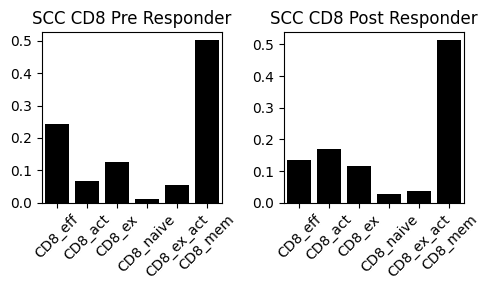

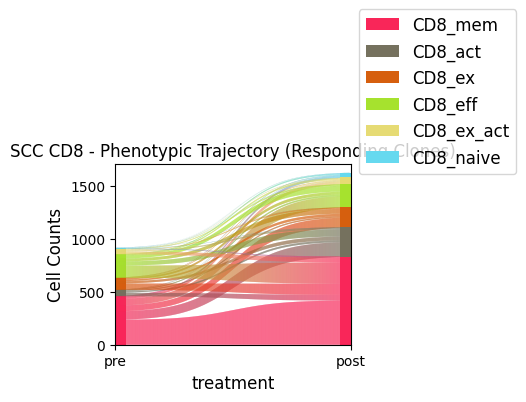

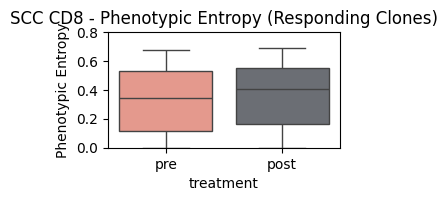

In [12]:
# nrclones = df[df["Phenotypic Entropy"] < 5]["Clone"].tolist()
# xdata = adata[adata.obs["trb"].isin(nrclones)]
xdata = adata[adata.obs["response"] == "Yes"]
xdata = xdata[xdata.obs["cancer"] == "scc"]
xdata = xdata[xdata.obs["disease"].isin(["scc_cd8","cd8_naive"])]

cols = ['CD8_eff', 'CD8_act', 'CD8_ex', 'CD8_naive','CD8_ex_act', 'CD8_mem']

fig, ax = plt.subplots(1,2,figsize=(5,3))

zdata = xdata[xdata.obs["treatment"] == "pre"]
tcri.pp.joint_distribution(zdata)
total = zdata.uns["joint_distribution"].to_numpy().sum()
pdist = zdata.uns["joint_distribution"].sum(axis=1) / total

sns.barplot(data=pdist,ax=ax[0],order=cols,color="#000000")
ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=45)
ax[0].set_title("SCC CD8 Pre Responder")

zdata = xdata[xdata.obs["treatment"] == "post"]
tcri.pp.joint_distribution(zdata)
total = zdata.uns["joint_distribution"].to_numpy().sum()
pdist = zdata.uns["joint_distribution"].sum(axis=1) / total

sns.barplot(data=pdist,ax=ax[1],order=cols,color="#000000")
ax[1].set_xticklabels(ax[1].get_xticklabels(), rotation=45)
ax[1].set_title("SCC CD8 Post Responder")
fig.tight_layout()
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/pdist_scc_r.pdf")

phenotype_colors = dict(zip(set(xdata.obs[xdata.uns["tcri_phenotype_key"]]), tcri.pl.tcri_colors[4:]))
tcri.pl.phenotypic_flux(xdata,splitby="treatment",order=["pre","post"],nt=False,normalize=False,phenotype_colors=phenotype_colors, figsize=(5,4),save="/Users/nceglia/Data/tcri/yost/figures/cd8_sankey_scc_r.pdf")
plt.title("SCC CD8 - Phenotypic Trajectory (Responding Clones)")


tcri.pp.joint_distribution(xdata)
tcri.pl.phenotypic_entropy(xdata,groupby="patient",splitby="treatment", save="/Users/nceglia/Data/tcri/yost/figures/pent_cd8_scc_r.pdf", figsize=(3,1.5))
plt.ylim(0,0.8)
plt.title("SCC CD8 - Phenotypic Entropy (Responding Clones)")

100%|██████████| 4/4 [00:35<00:00,  8.95s/it]


                Clone       dkl patient response Comparison
1    CASSPPTSGGRGEQFF  2.364799   su013       No   pre_post
2       CATSGVGSNVLTF  0.267782   su013       No   pre_post
3        CASSLDSYEQYF  0.497357   su013       No   pre_post
4         CAWNGRQGMYF  1.569900   su013       No   pre_post
6       CASSWGGLYEQYF  0.340607   su013       No   pre_post
..                ...       ...     ...      ...        ...
140    CASSEAGSGEKLFF  1.251246   su011      Yes   pre_post
141   CAIRVEGMGGTEAFF  0.148174   su011      Yes   pre_post
142  CASSALLGSNTGELFF  0.461141   su011      Yes   pre_post
143  CASSDTRGTYNSPLHF  0.239913   su011      Yes   pre_post
144     CASSFGVNYGYTF  0.065028   su011      Yes   pre_post

[238 rows x 5 columns]


100%|██████████| 4/4 [00:35<00:00,  8.83s/it]

                Clone        l1 patient response Comparison
0     CASSVRDSSSYEQYF  2.000000   su013       No   pre_post
1    CASSPPTSGGRGEQFF  0.758452   su013       No   pre_post
2       CATSGVGSNVLTF  0.436841   su013       No   pre_post
3        CASSLDSYEQYF  0.511167   su013       No   pre_post
4         CAWNGRQGMYF  1.242326   su013       No   pre_post
..                ...       ...     ...      ...        ...
140    CASSEAGSGEKLFF  0.678546   su011      Yes   pre_post
141   CAIRVEGMGGTEAFF  0.423234   su011      Yes   pre_post
142  CASSALLGSNTGELFF  0.462485   su011      Yes   pre_post
143  CASSDTRGTYNSPLHF  0.250404   su011      Yes   pre_post
144     CASSFGVNYGYTF  0.046400   su011      Yes   pre_post

[431 rows x 5 columns]


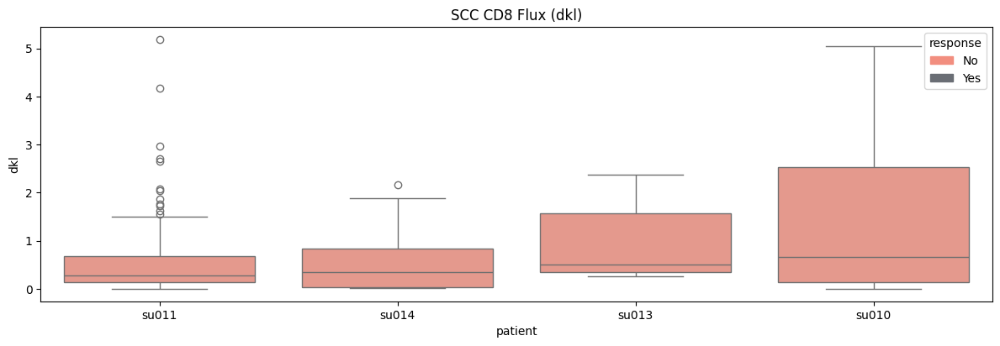

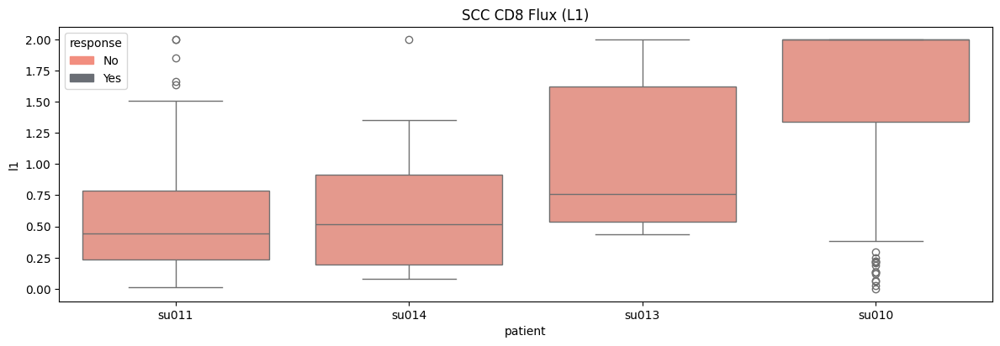

In [16]:

xdata = adata[adata.obs["cancer"] == "scc"]
xdata = xdata[xdata.obs["disease"].isin(["scc_cd8","cd8_naive"])]

tcri.pp.joint_distribution(xdata)
tcri.pl.flux(xdata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="dkl",figsize=(12,4))
plt.title("SCC CD8 Flux (dkl)")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/scc_flux_dkl.pdf")

tcri.pl.flux(xdata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="l1",figsize=(12,4))
plt.title("SCC CD8 Flux (L1)")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/scc_flux_l1.pdf")

100%|██████████| 11/11 [00:21<00:00,  1.97s/it]


                 Clone       dkl patient response Comparison
0     CASSLIARTSTDTQYF  0.058574   su012      Yes   pre_post
1        CASSPARNTEAFF  0.872864   su012      Yes   pre_post
2      CASSEQGRGADTQYF  0.019022   su012      Yes   pre_post
3        CASSLEGSYEQYF  0.498103   su012      Yes   pre_post
4        CASSVASNQPQHF  0.394103   su012      Yes   pre_post
..                 ...       ...     ...      ...        ...
8      CASSQRAGAGGELFF  0.121985   su010       No   pre_post
9    CASSLEIAGGGSYGYTF  0.645451   su010       No   pre_post
10      CASSQEGRNQPQHF  1.853524   su010       No   pre_post
11    CATSDLASGSRDTQYF  2.328974   su010       No   pre_post
12  CASSLFNSAQSMNTEAFF  1.347415   su010       No   pre_post

[452 rows x 5 columns]


100%|██████████| 11/11 [00:21<00:00,  1.93s/it]


                 Clone        l1 patient response Comparison
0     CASSLIARTSTDTQYF  0.100900   su012      Yes   pre_post
1        CASSPARNTEAFF  0.568430   su012      Yes   pre_post
2      CASSEQGRGADTQYF  0.042059   su012      Yes   pre_post
3        CASSLEGSYEQYF  0.725485   su012      Yes   pre_post
4        CASSVASNQPQHF  0.369568   su012      Yes   pre_post
..                 ...       ...     ...      ...        ...
8      CASSQRAGAGGELFF  0.214398   su010       No   pre_post
9    CASSLEIAGGGSYGYTF  0.715689   su010       No   pre_post
10      CASSQEGRNQPQHF  0.667807   su010       No   pre_post
11    CATSDLASGSRDTQYF  1.595800   su010       No   pre_post
12  CASSLFNSAQSMNTEAFF  0.785780   su010       No   pre_post

[456 rows x 5 columns]


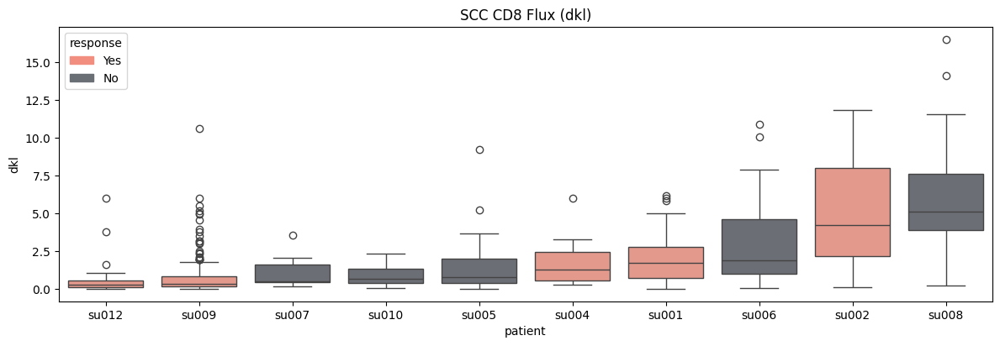

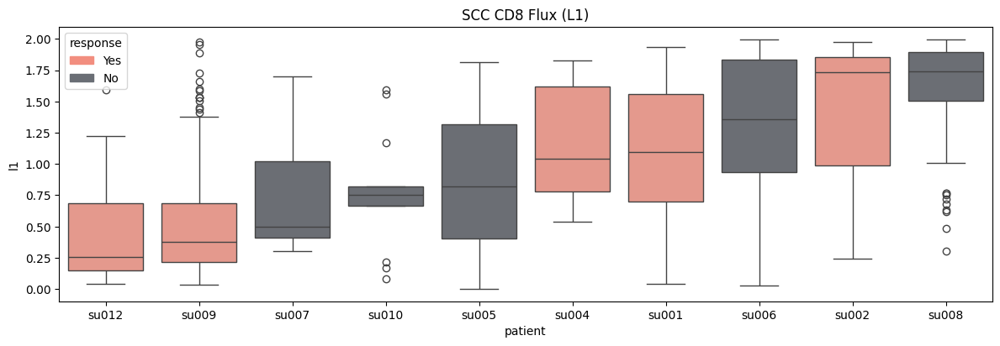

In [43]:

xdata = adata[adata.obs["cancer"] == "bcc"]
xdata = xdata[xdata.obs["disease"].isin(["bcc_cd8","cd8_naive"])]

tcri.pp.joint_distribution(xdata)
tcri.pl.flux(xdata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="dkl",figsize=(12,4))
plt.title("SCC CD8 Flux (dkl)")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/scc_flux_dkl.pdf")

tcri.pl.flux(xdata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="l1",figsize=(12,4))
plt.title("SCC CD8 Flux (L1)")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/scc_flux_l1.pdf")

# Clonality

['CD8_naive', 'CD8_mem', 'CD8_eff', 'CD8_act', 'CD8_ex_act', 'CD8_ex']
['CD8_naive', 'CD8_mem', 'CD8_eff', 'CD8_act', 'CD8_ex_act', 'CD8_ex']


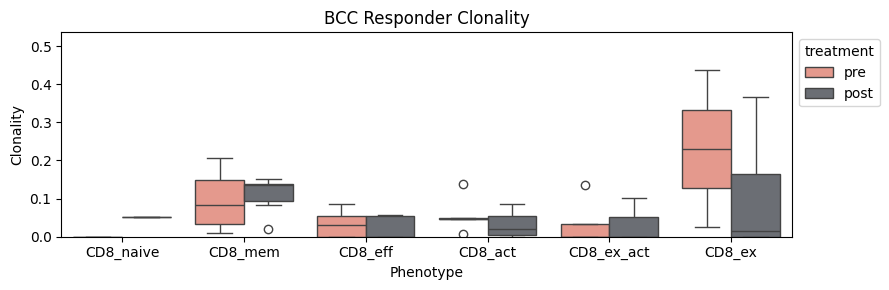

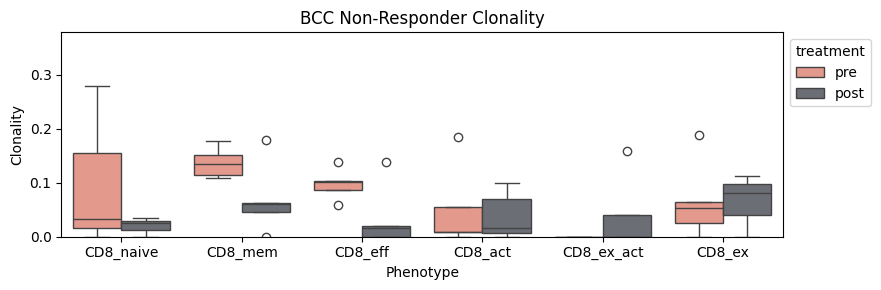

In [41]:

xdata= adata[adata.obs["response"] == "Yes"]
xdata = xdata[xdata.obs["clone_size"] > 1]
xdata = xdata[xdata.obs["disease"].isin(["bcc_cd8","cd8_naive"])]
tcri.pl.clonality(xdata, groupby="patient",splitby="treatment",figsize=(9,3), order=["CD8_naive","CD8_mem","CD8_eff","CD8_act","CD8_ex_act","CD8_ex"])
plt.title("BCC Responder Clonality")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/bcc_clonality_r_pre.pdf")


xdata= adata[adata.obs["response"] == "No"]
xdata = xdata[xdata.obs["clone_size"] > 1]
xdata = xdata[xdata.obs["disease"].isin(["bcc_cd8","cd8_naive"])]
tcri.pl.clonality(xdata, groupby="patient",splitby="treatment",figsize=(9,3), order=["CD8_naive","CD8_mem","CD8_eff","CD8_act","CD8_ex_act","CD8_ex"])
plt.title("BCC Non-Responder Clonality")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/bcc_clonality_nr_post.pdf")


['CD8_ex_act', 'CD8_act', 'CD8_ex', 'CD8_mem', 'CD8_eff']
['CD8_act', 'CD8_ex', 'CD8_mem', 'CD8_eff', 'CD8_ex_act']


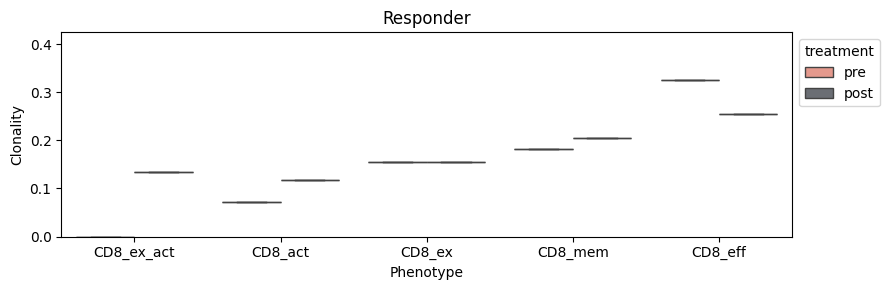

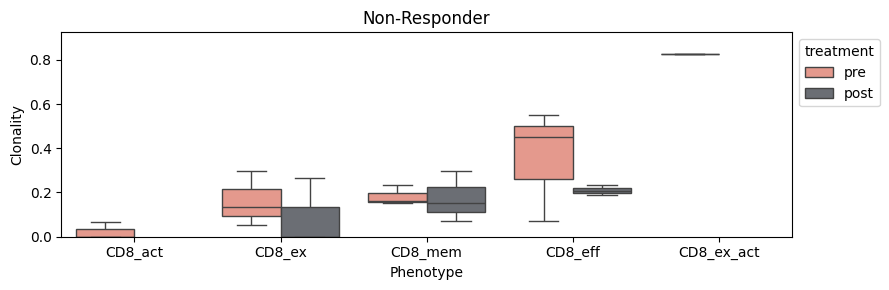

In [42]:
responder= adata[adata.obs["response"] == "Yes"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="scc_cd8"]
tcri.pl.clonality(responder, groupby="patient", splitby="treatment",figsize=(9,3))
plt.title("Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/yes_cent.pdf")

responder= adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="scc_cd8"]
tcri.pl.clonality(responder, groupby="patient", splitby="treatment",figsize=(9,3))
plt.title("Non-Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/no_cent.pdf")

['CD8_ex', 'CD8_mem', 'CD8_act', 'CD8_ex_act', 'CD8_eff']
['CD8_ex', 'CD8_act', 'CD8_mem', 'CD8_eff', 'CD8_ex_act']


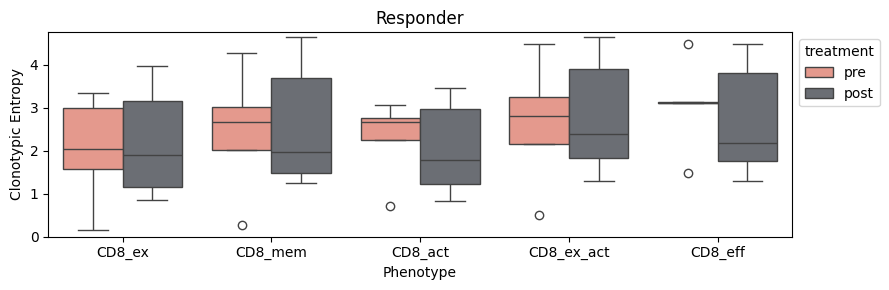

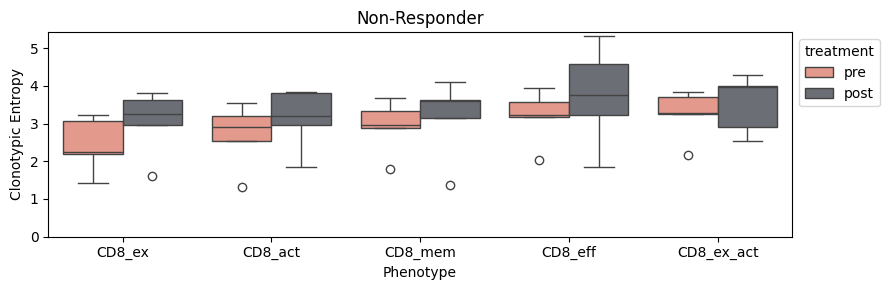

In [28]:
responder= adata[adata.obs["response"] == "Yes"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="bcc_cd8"]
tcri.pl.clonotypic_entropy(responder, normalized=False, groupby="patient", splitby="treatment", method='probabilistic',figsize=(9,3))
plt.title("Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/yes_cent.pdf")


responder= adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="bcc_cd8"]
tcri.pl.clonotypic_entropy(responder, normalized=False, groupby="patient", splitby="treatment", method='probabilistic',figsize=(9,3))
plt.title("Non-Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/no_cent.pdf")

['CD8_mem', 'CD8_ex', 'CD8_act', 'CD8_eff', 'CD8_ex_act']
['CD8_ex', 'CD8_mem', 'CD8_act', 'CD8_eff', 'CD8_ex_act']


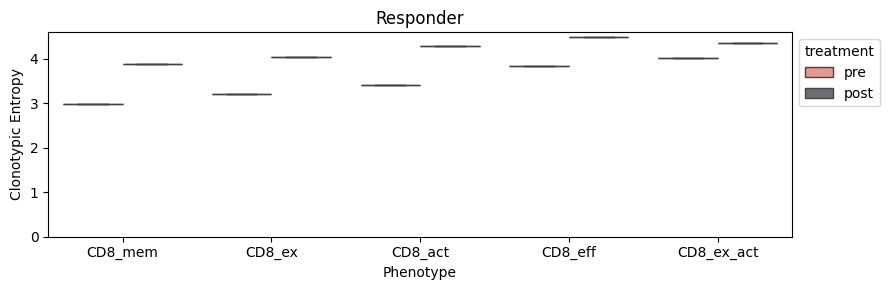

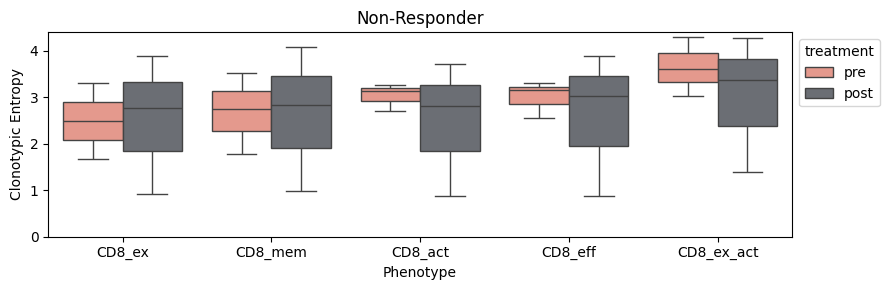

In [29]:
responder= adata[adata.obs["response"] == "Yes"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="scc_cd8"]
tcri.pl.clonotypic_entropy(responder, normalized=False, groupby="patient", splitby="treatment", method='probabilistic',figsize=(9,3))
plt.title("Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/yes_cent.pdf")


responder= adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["clone_size"] > 1]
responder = responder[responder.obs["disease"]=="scc_cd8"]
tcri.pl.clonotypic_entropy(responder, normalized=False, groupby="patient", splitby="treatment", method='probabilistic',figsize=(9,3))
plt.title("Non-Responder")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/no_cent.pdf")

In [31]:
# tcri.pp.joint_distribution(adata)
# tcri.pl.flux(adata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="l1",figsize=(12,4))
# plt.title("Responder L1")
# plt.savefig("/Users/nceglia/Data/tcri/yost/figures/flux_l1_yes.pdf")

In [ ]:
tcri.pp.joint_distribution(adata)
tcri.pl.flux(adata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="dkl",figsize=(12,4))
plt.title("Responder L1")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/flux_l1_yes.pdf")

In [32]:
tcri.pp.joint_distribution(adata)
tcri.pl.flux(adata, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="dkl",figsize=(12,4))
plt.title("Responder L1")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/flux_l1_yes.pdf")


  0%|          | 0/14 [00:11<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.flux(responder, key="treatment", order=['pre','post'], groupby="patient",paint="response", method="probabilistic", distance_metric="l1",figsize=(7,5))
plt.title("Responder L1")
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/flux_l1_yes.pdf")


100%|██████████| 2/2 [00:09<00:00,  4.69s/it]


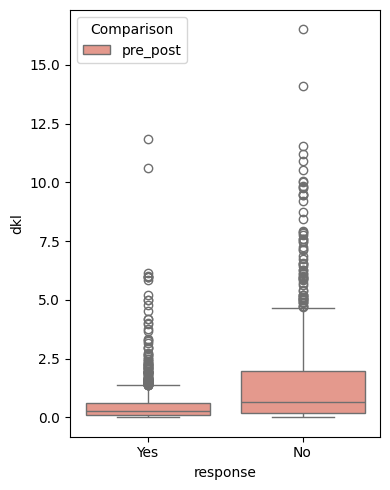

In [327]:
tcri.pl.flux(adata, key="treatment", order=["pre","post"], groupby="response", method="probabilistic", distance_metric="dkl",figsize=(4,5))
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/dkl_response.pdf")

100%|██████████| 2/2 [00:09<00:00,  4.76s/it]


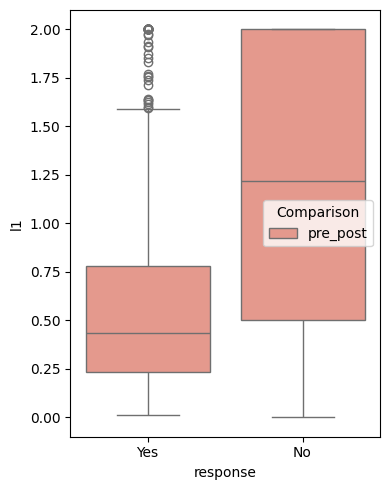

In [328]:
tcri.pl.flux(adata, key="treatment", order=["pre","post"], groupby="response", method="probabilistic", distance_metric="l1",figsize=(4,5))
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/dkl_response.pdf")

<Axes: xlabel='Response', ylabel='Coefficient'>

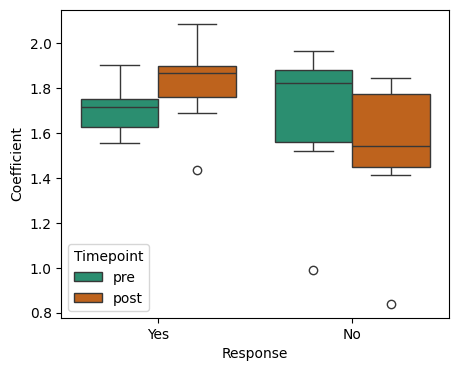

In [554]:
groupby = "patient"
ps = []
rs = []
r2 = []
ts = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        pdata = rdata[rdata.obs[groupby] == p]
        for tp in set(pdata.obs["treatment"]):
            tdata = pdata[pdata.obs["treatment"] == tp]
            ps.append(p)
            rs.append(r)
            ts.append(tp)
            r2.append(tcri.tl.phenotypic_entropy(tdata))
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2,"Timepoint":ts})
fig, ax = plt.subplots(1,1,figsize=(5,4))
sns.boxplot(data=df, x="Response",y="Coefficient", hue="Timepoint",ax=ax, hue_order=["pre","post"],palette="Dark2")
#sns.stripplot(data=df, x="Response",y="Coefficient", hue="Timepoint",ax=ax, hue_order=["pre","post"],palette="Dark2")
#fig.savefig("/Users/ceglian/tp_pentropy.pdf")

{'CD8_ex': 0.03634995096747073, 'CD8_act': 0.18958181495512866, 'CD8_ex_act': 5.466111070122111e-05, 'CD8_mem': 0.3642508341413722, 'CD8_eff': 0.40976273882532716, 'Tregs': 0.0, 'Tfh': 0.0, 'Th17': 0.0, 'Naive': 0.0, 'CD8_naive': 0.0}
{'CD8_ex': 0.023070237954372966, 'CD8_act': 0.0005012936818898299, 'CD8_ex_act': 0.004382002294362872, 'CD8_mem': 0.9648745881241918, 'CD8_eff': 0.007171877945182571, 'Tregs': 0.0, 'Tfh': 0.0, 'Th17': 0.0, 'Naive': 0.0, 'CD8_naive': 0.0}
{'CD8_ex': 0.00010142558796599472, 'CD8_act': 0.0009862323922458468, 'CD8_ex_act': 2.0006928427648934e-05, 'CD8_mem': 0.9973559844433457, 'CD8_eff': 0.0015363506480147989, 'Tregs': 0.0, 'Tfh': 0.0, 'Th17': 0.0, 'Naive': 0.0, 'CD8_naive': 0.0}
{'CD8_ex': 0.01687825641883903, 'CD8_act': 0.07821493427092535, 'CD8_ex_act': 0.09572903715725437, 'CD8_mem': 0.7844945335720113, 'CD8_eff': 0.024683238580969984, 'Tregs': 0.0, 'Tfh': 0.0, 'Th17': 0.0, 'Naive': 0.0, 'CD8_naive': 0.0}
{'CD8_ex': 0.012280338112042027, 'CD8_act': 0.0040

Text(0.5, 1.0, 'SCC CD8')

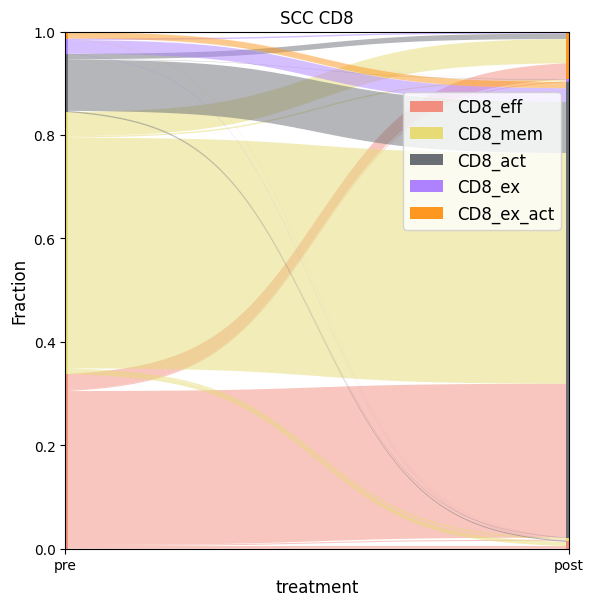

In [565]:
xdata = adata[adata.obs["patient"] == "su008"]
xdata = xdata[xdata.obs["disease"].isin(["cd8_naive","bcc_cd8"])]
xdata = xdata[xdata.obs["clone_size"] > 10]
phenotypic_flux(xdata,splitby="treatment",order=["pre","post"],nt=False,normalize=True,figsize=(6,6))
plt.title("SCC CD8")

AttributeError: module 'seaborn.categorical' has no attribute '_BoxPlotter'

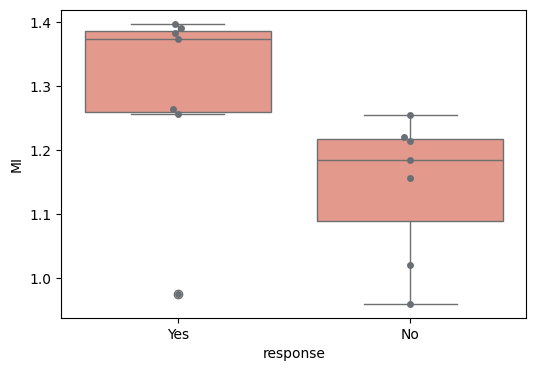

In [572]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statannotations.Annotator import Annotator
import matplotlib.patches as mpatches

from gseapy import dotplot
import tqdm

import collections
import operator
import itertools

def mutual_information(adata, groupby, splitby=None, method="probabilistic", figsize=(6,5)):
    mis = []
    groups = []
    splits = []
    for group in set(adata.obs[groupby]):
        gdata = adata[adata.obs[groupby] == group]
        if splitby != None:
            for split in set(gdata.obs[splitby]):
                sdata = gdata[gdata.obs[splitby] == split]
                mi = mutual_information_tl(sdata, method=method)
                mis.append(mi)
                groups.append(group)
                splits.append(split)
        else:
            joint_distribution(gdata)
            mi = mutual_information_tl(gdata,method=method)
            mis.append(mi)
            groups.append(group)
    df = pd.DataFrame.from_dict({"MI":mis, groupby: groups})
    if splitby != None:
        df[splitby] = splits
    order = list(set(adata.obs[splitby]))

    fig, ax = plt.subplots(1,1,figsize=figsize)
    sns.boxplot(data=df,x=splitby,y="MI",ax=ax,order=order)
    sns.swarmplot(data=df,x=splitby,y="MI",order=order,ax=ax)
    pairs = list(itertools.combinations(list(set(adata.obs[splitby])),2))
    # ax, test_results = add_stat_annotation(ax, 
    #                                         data=df,
    #                                         x=splitby,
    #                                         y="MI", 
    #                                         order=order,
    #                                         box_pairs=pairs, 
    #                                         test='Mann-Whitney', 
    #                                         text_format='star', 
    #                                         loc='outside', 
    #                                         verbose=2)
    annotator = Annotator(ax, pairs, data=df, x=splitby, y="MI", order=order)
    annotator.configure(test='Mann-Whitney', text_format='star', loc='outside')
    annotator.apply_and_annotate()
    fig.tight_layout()
    return ax

mutual_information(adata, groupby="patient",splitby="response",figsize=(6,4))
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/mutual_info.pdf")

100%|██████████| 2/2 [00:09<00:00,  4.70s/it]


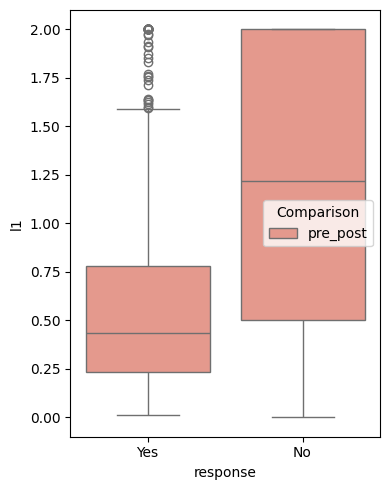

In [44]:
tcri.pl.flux(adata, key="treatment", order=["pre","post"], groupby="response", method="probabilistic", distance_metric="l1",figsize=(4,5))
plt.savefig("/Users/nceglia/Data/tcri/yost/figures/l1_response.pdf")

In [46]:
set(adata.obs["disease"])

{'bcc_cd4', 'bcc_cd8', 'cd8_naive', 'scc_cd4', 'scc_cd8'}

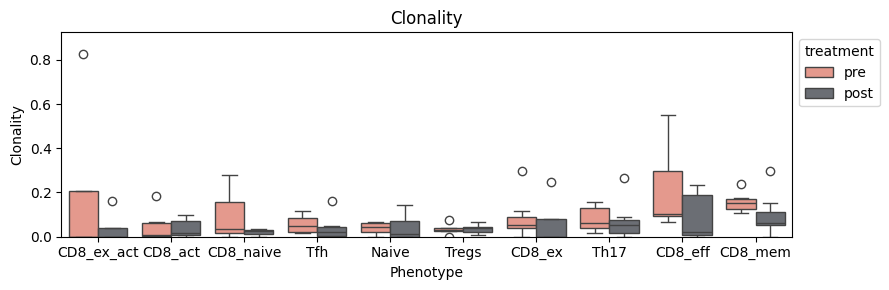

In [64]:
responder= adata[adata.obs["response"] == "No"]
responder = responder[responder.obs["clone_size"] > 1]
tcri.pl.clonality(responder, groupby="patient",splitby="treatment", s=10,figsize=(9,3))
plt.savefig("/Users/ceglian/clonal_yost_cd8_no.pdf")

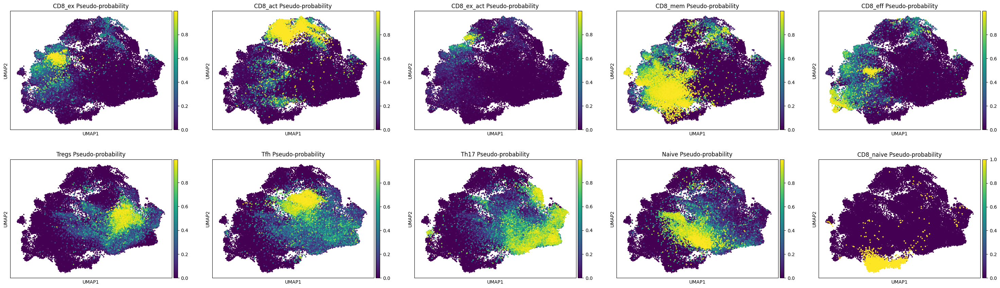

In [47]:
import numpy as np
for x in prob_cols:
    adata.obs[x] = np.nan_to_num(adata.obs[x])
sc.pl.umap(adata,color=prob_cols, ncols=5, s=30, save="probability.pdf",palette="rocket")
!cp figures/umapprobability.pdf /Users/nceglia/Data/tcri/yost/figures/

In [48]:
set(adata.obs['genevector'])

{'CD8_act',
 'CD8_eff',
 'CD8_ex',
 'CD8_ex_act',
 'CD8_mem',
 'CD8_naive',
 'Naive',
 'Tfh',
 'Th17',
 'Tregs'}

In [49]:
ct = []
for x,y in zip(adata.obs["treatment"],adata.obs["genevector"]):
    if x == "pre":
        if y == "CD8_mem":
            ct.append("Yes")
        else:
            ct.append("No")
    else:
        ct.append("Yes")
adata.obs["tp_test"] = ct

In [50]:
set(adata.obs["disease"])

{'bcc_cd4', 'bcc_cd8', 'cd8_naive', 'scc_cd4', 'scc_cd8'}

In [51]:
sub = adata[adata.obs["response"] == "Yes"]
sub = sub[sub.obs["disease"] == "scc_cd8"]
sub = sub[sub.obs["genevector"].isin(["CD8_eff","CD8_mem","CD8_act","CD8_ex_act","CD8_ex"])]
tcri.pp.clone_size(sub)
sub=sub[sub.obs["clone_size"] >5]
tcri.pl.phenotypic_flux(sub,splitby="treatment",order=["pre","post"],nt=False,normalize=False)
plt.savefig("/Users/ceglian/scc_cd8_yes.pdf")

TypeError: set expected at most 1 argument, got 2

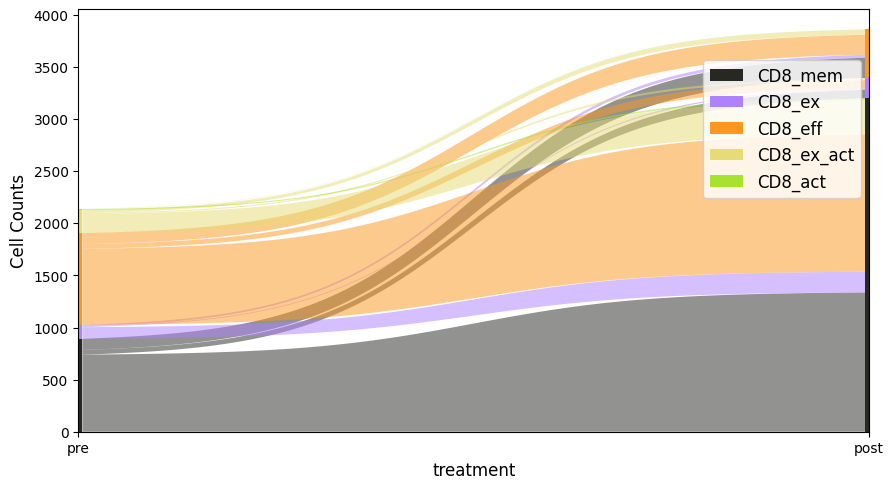

In [51]:
sub = adata[adata.obs["response"] == "No"]
sub = sub[sub.obs["disease"] == "scc_cd8"]
sub = sub[sub.obs["genevector"].isin(["CD8_eff","CD8_mem","CD8_act","CD8_ex_act","CD8_ex"])]
tcri.pp.clone_size(sub)
sub=sub[sub.obs["clone_size"] > 5]
tcri.pl.phenotypic_flux(sub,splitby="treatment",order=["pre","post"],nt=False,normalize=False)
plt.savefig("/Users/ceglian/scc_cd8_no.pdf")

In [52]:
def phenotypic_entropies(adata, method="probabilistic", normalized=True):
    tcri.pp.joint_distribution(adata, method=method)
    tcr_sequences = adata.obs[adata.uns["tcri_clone_key"]].tolist()
    unique_tcrs = np.unique(tcr_sequences)
    jd = adata.uns["joint_distribution"].to_numpy() 
    jd = jd / np.sum(jd)
    clonotype_entropies = np.zeros(jd.shape[1])
    max_entropy = np.log(jd.shape[0])
    for i, clonotype_distribution in enumerate(jd.T):
        normalized_distribution = clonotype_distribution / np.sum(clonotype_distribution)
        epsilon = np.finfo(float).eps
        if normalized:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon)) / max_entropy
        else:
            clonotype_entropies[i] = -np.sum(normalized_distribution * np.log(normalized_distribution + epsilon))
    tcr_to_entropy_dict = dict(zip(unique_tcrs, clonotype_entropies))
    return tcr_to_entropy_dict


In [53]:
ents["CASGLAGYNEQFF"]

NameError: name 'ents' is not defined

In [ ]:
import pandas as pd
def size_to_entropy(adata):
    clone = []
    size = []
    ent = []
    h = []
    ents = phenotypic_entropies(adata)
    sizes = dict(zip(adata.obs[adata.uns["tcri_clone_key"]],adata.obs["clone_size"]))
    for tcr,entropy in ents.items():
        ent.append(entropy)
        size.append(sizes[tcr])
        clone.append(tcr)
        if sizes[tcr] > 30:
            h.append("Expanded")
        else:
            h.append("Not Expanded")
    df = pd.DataFrame.from_dict({"Entropy":ent,"Size":size,"TCR":clone,"Expanded":h}) 
    #sns.regplot(data=df,x="Entropy",y="Size",hue="Exp")
    sns.boxplot(data=df,x=)

In [ ]:
groupby = "patient"
ps = []
rs = []
r2 = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        clone = []
        size = []
        ent = []
        pdata = rdata[rdata.obs[groupby] == p]
        ents = phenotypic_entropies(pdata)
        tcri.pp.clone_size(pdata)
        sizes = dict(zip(pdata.obs[pdata.uns["tcri_clone_key"]],pdata.obs["clone_size"]))
        for tcr,entropy in ents.items():
            ent.append(entropy)
            size.append(sizes[tcr])
            clone.append(tcr)
        df = pd.DataFrame.from_dict({"Entropy":ent,"Size":size,"TCR":clone})
        c = df["Entropy"].corr(df["Size"])
        ps.append(p)
        rs.append(r)
        r2.append(c)
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2})
df

,Patient,Response,Coefficient
0,su001,Yes,0.051901
1,su004,Yes,0.244784
2,su002,Yes,0.318041
3,su009,Yes,0.063196
4,su011,Yes,0.194186
5,su012,Yes,0.063922
6,su003,Yes,0.275284
7,su014,No,0.062883
8,su010,No,0.110112
9,su013,No,0.121501


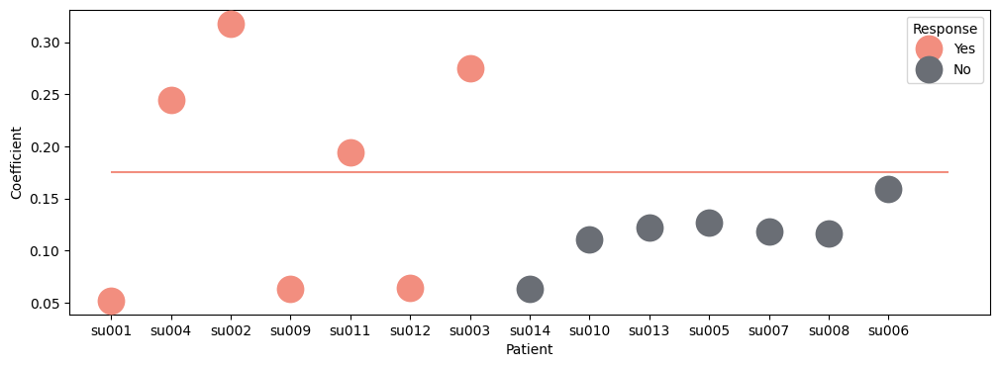

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(12,4))
sns.stripplot(data=df, x="Patient",y="Coefficient",s=20, hue="Response",ax=ax)
ax.hlines(y=0.175,xmin=0,xmax=14)
fig.savefig("/Users/ceglian/phenotypic_entropy.pdf")

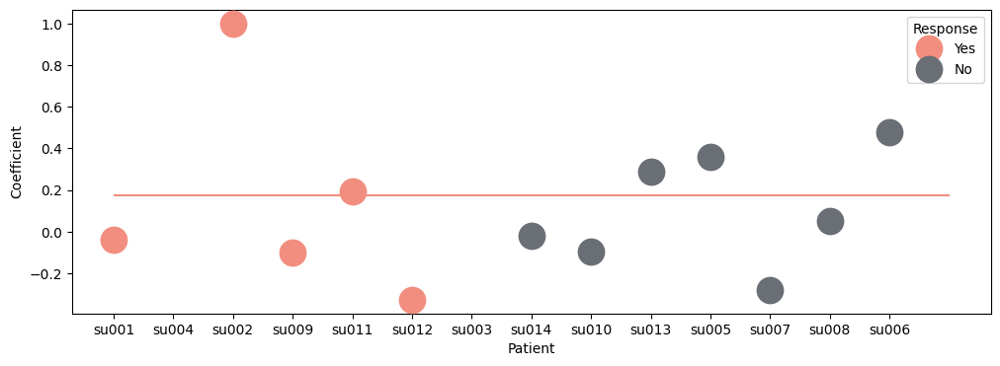

In [ ]:
groupby = "patient"
ps = []
rs = []
r2 = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        clone = []
        size = []
        ent = []
        pdata = rdata[rdata.obs[groupby] == p]
        ents = phenotypic_entropies(pdata)
        tcri.pp.clone_size(pdata)
        sizes = dict(zip(pdata.obs[pdata.uns["tcri_clone_key"]],pdata.obs["clone_size"]))
        for tcr,entropy in ents.items():
            if sizes[tcr] > 10:
                ent.append(entropy)
                size.append(sizes[tcr])
                clone.append(tcr)
        df = pd.DataFrame.from_dict({"Entropy":ent,"Size":size,"TCR":clone})
        c = df["Entropy"].corr(df["Size"])
        ps.append(p)
        rs.append(r)
        r2.append(c)
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2})
fig, ax = plt.subplots(1,1,figsize=(12,4))
sns.stripplot(data=df, x="Patient",y="Coefficient",s=20, hue="Response",ax=ax)
ax.hlines(y=0.175,xmin=0,xmax=14)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/ceglian/tp_pentropy.pdf'

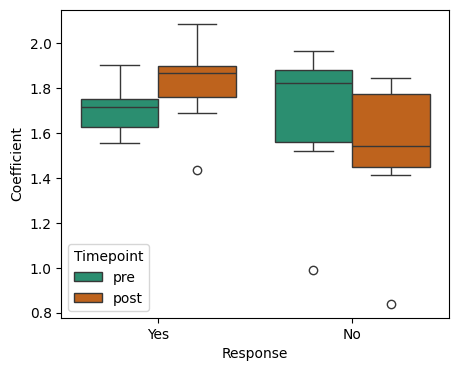

In [72]:
groupby = "patient"
ps = []
rs = []
r2 = []
ts = []
for r in set(adata.obs["response"]):
    rdata = adata[adata.obs["response"] == r]
    for p in set(rdata.obs[groupby]):
        pdata = rdata[rdata.obs[groupby] == p]
        for tp in set(pdata.obs["treatment"]):
            tdata = pdata[pdata.obs["treatment"] == tp]
            ps.append(p)
            rs.append(r)
            ts.append(tp)
            r2.append(tcri.tl.phenotypic_entropy(tdata))
df = pd.DataFrame.from_dict({"Patient":ps,"Response":rs,"Coefficient":r2,"Timepoint":ts})
fig, ax = plt.subplots(1,1,figsize=(5,4))
sns.boxplot(data=df, x="Response",y="Coefficient", hue="Timepoint",ax=ax, hue_order=["pre","post"],palette="Dark2")
fig.savefig("/Users/ceglian/tp_pentropy.pdf")

  0%|          | 0/9563 [00:00<?, ?it/s]

100%|██████████| 9563/9563 [00:00<00:00, 57746.90it/s]


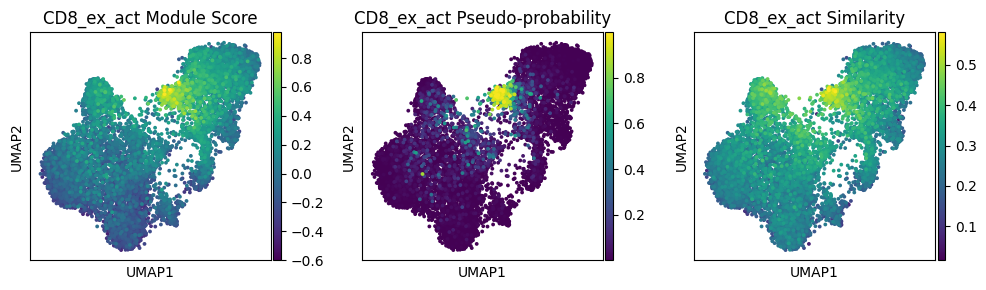

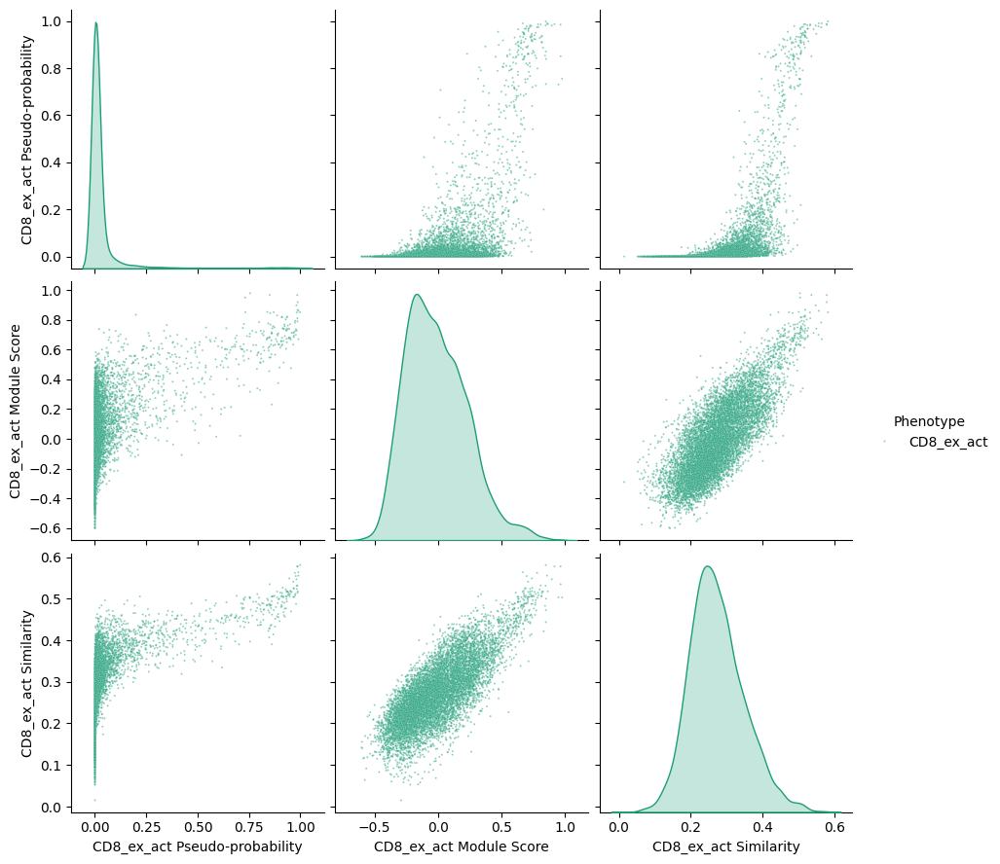

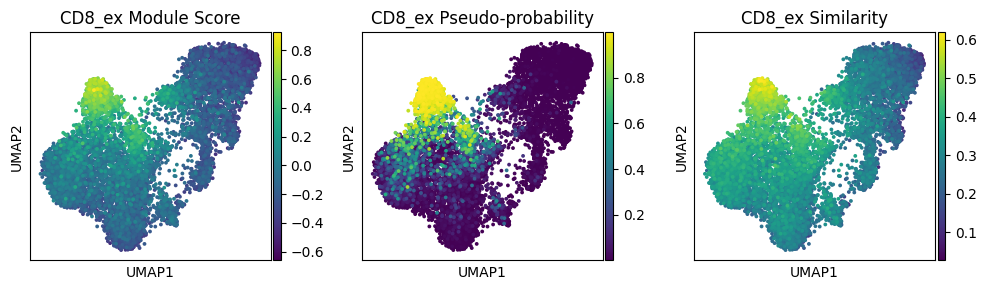

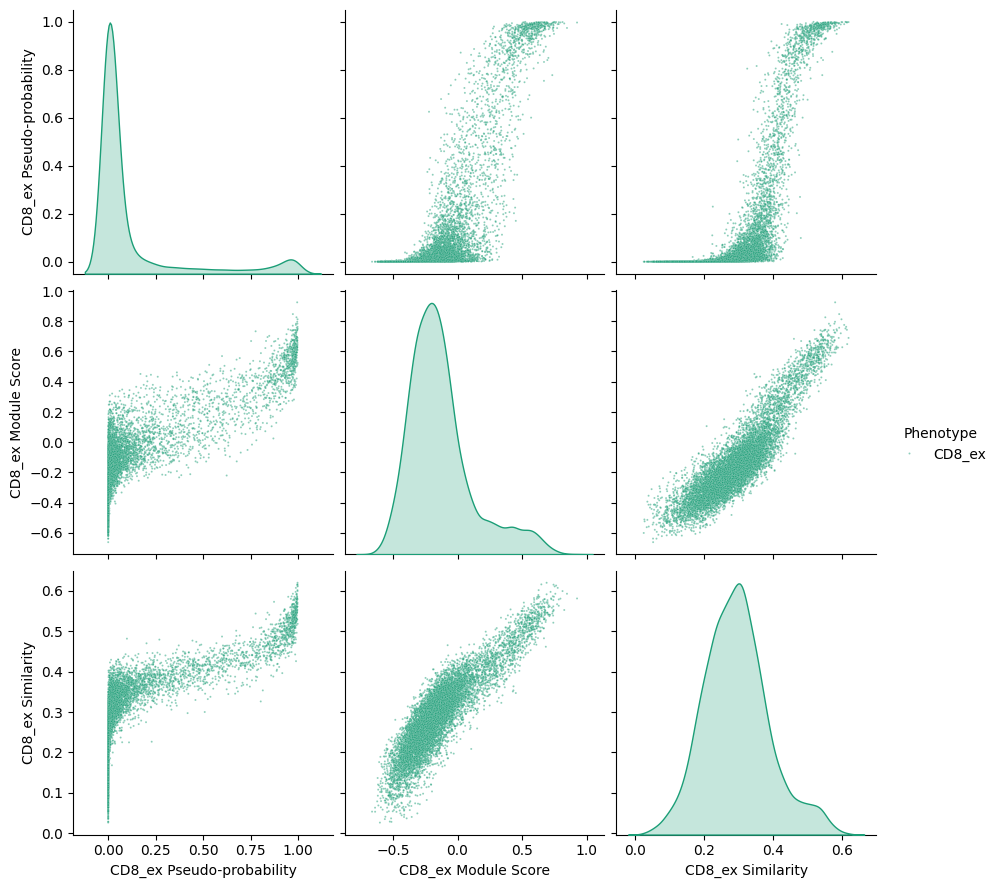

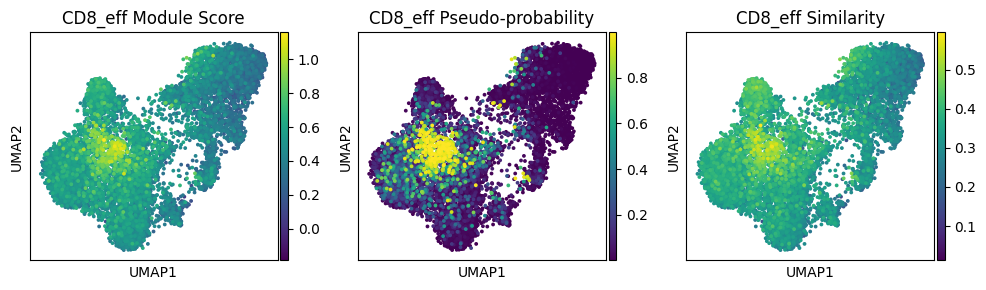

...

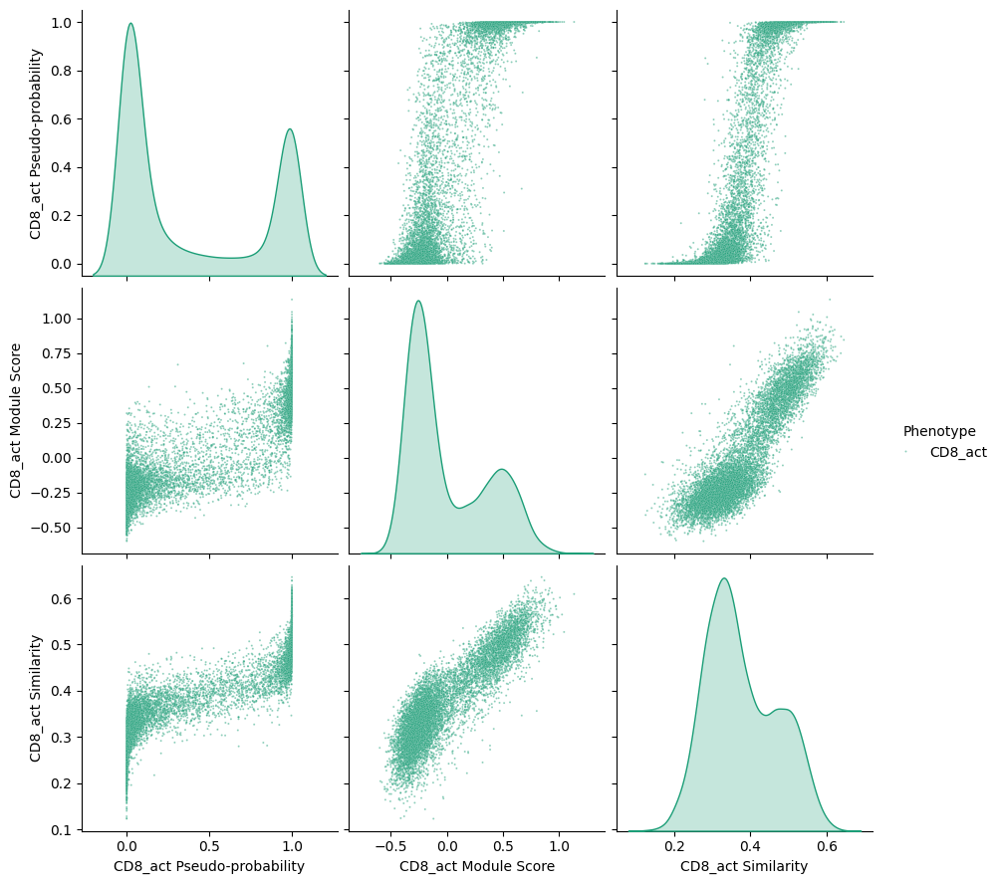

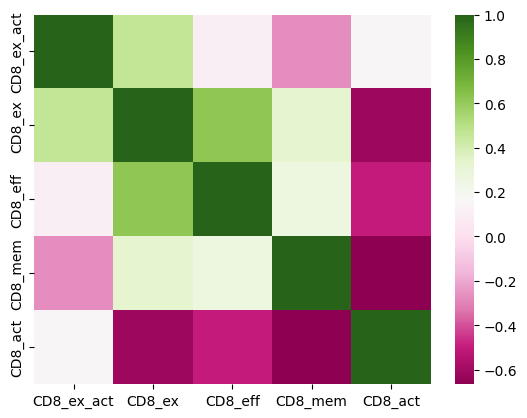

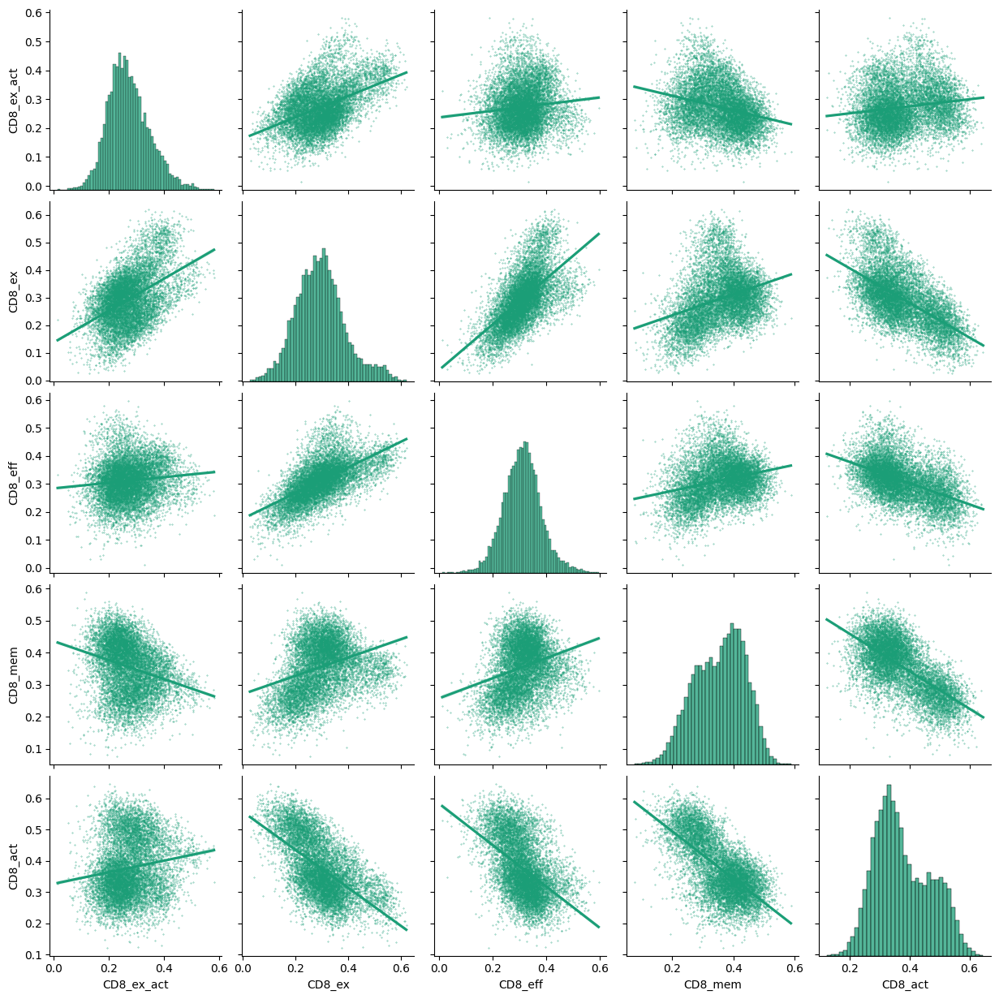

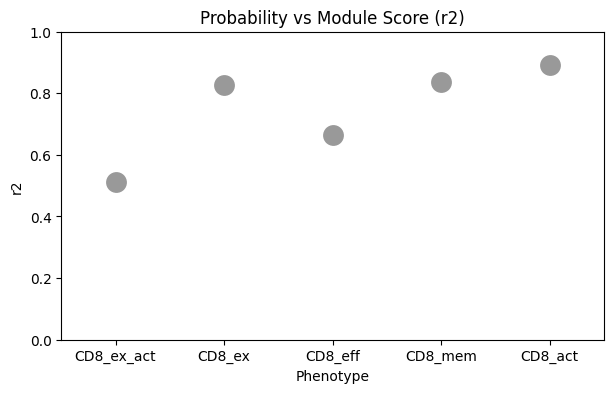

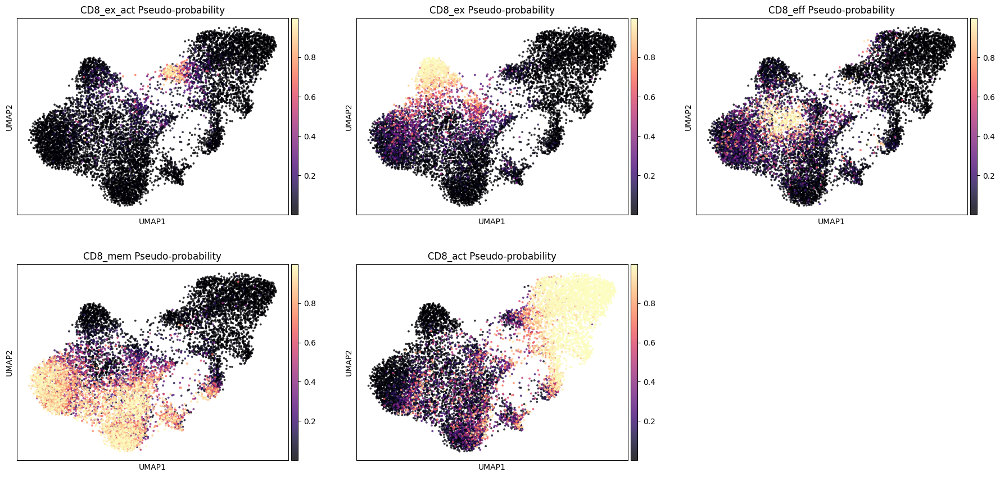

<Figure size 640x480 with 0 Axes>

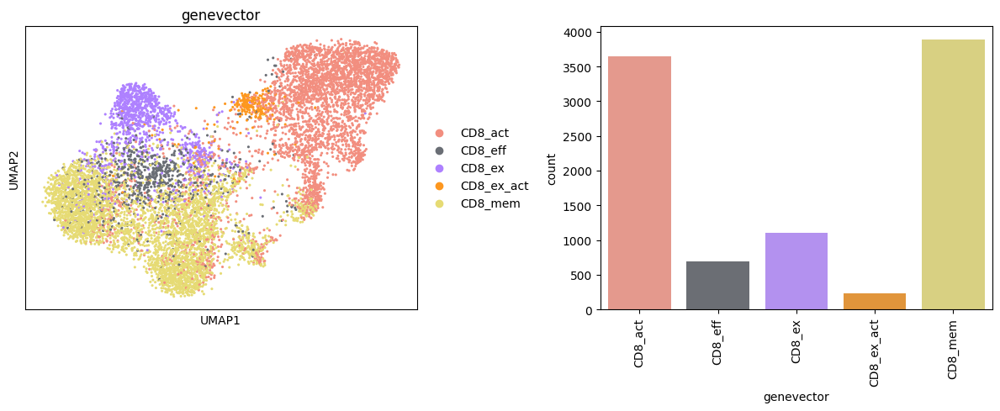

         Falling back to preprocessing with `sc.pp.pca` and default params.


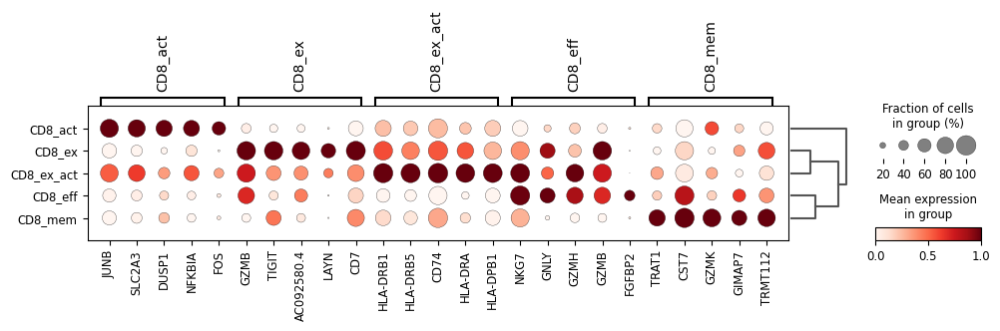

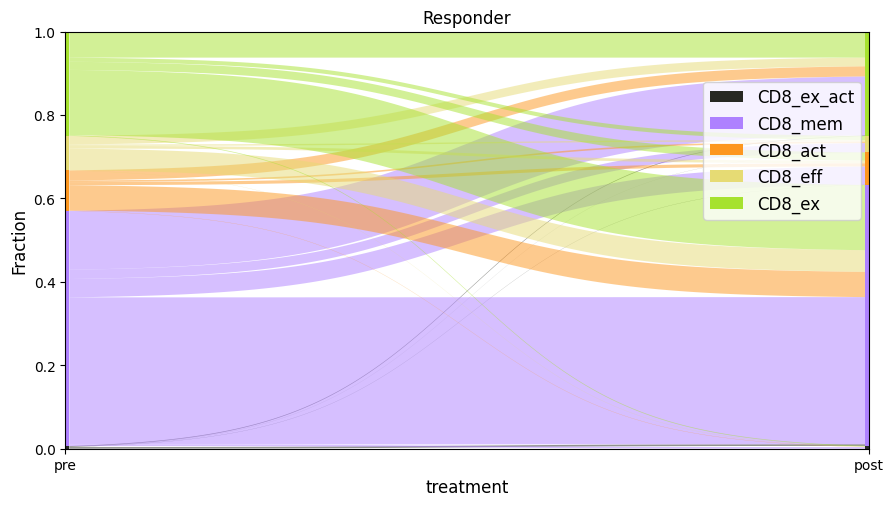

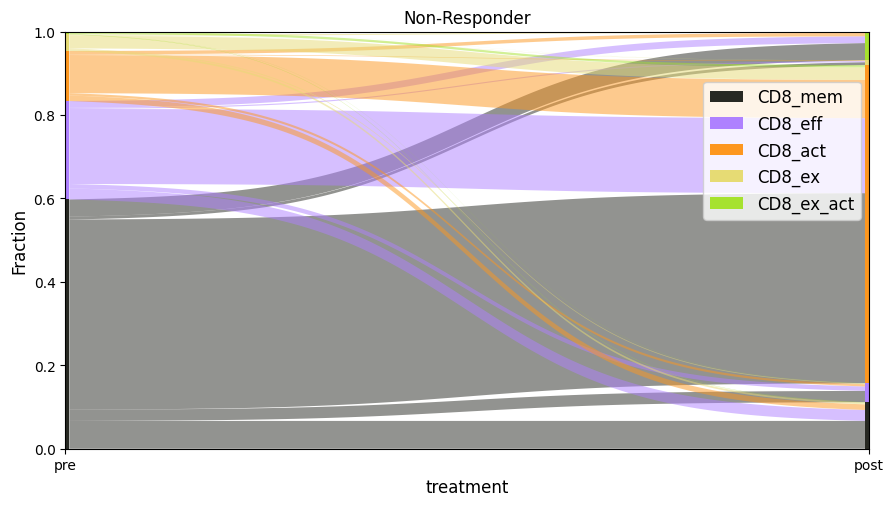

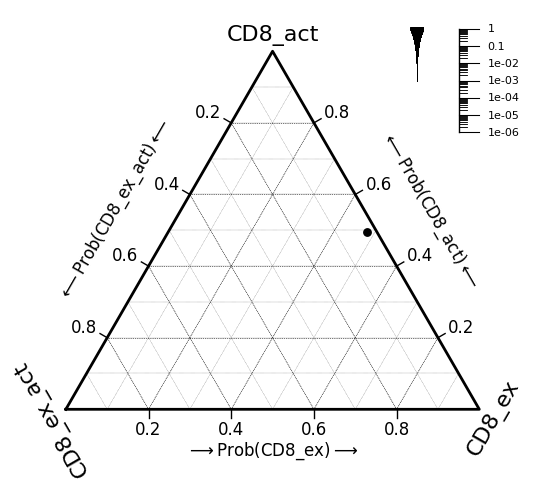

100%|██████████| 11/11 [00:01<00:00,  8.02it/s]


<Axes: xlabel='patient', ylabel='l1'>

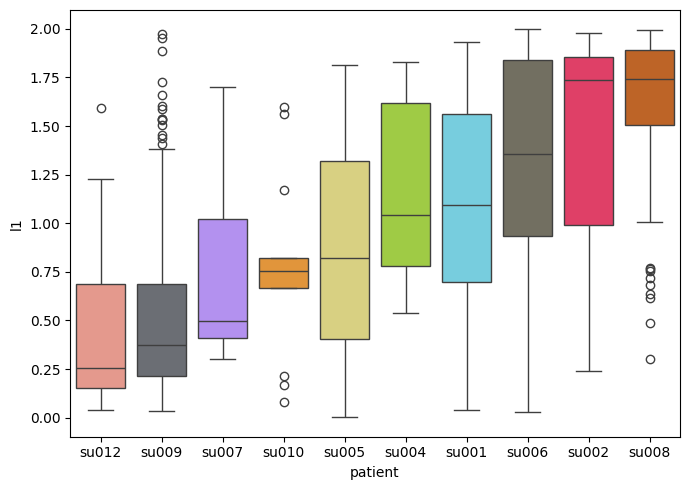

100%|██████████| 11/11 [00:01<00:00,  7.71it/s]


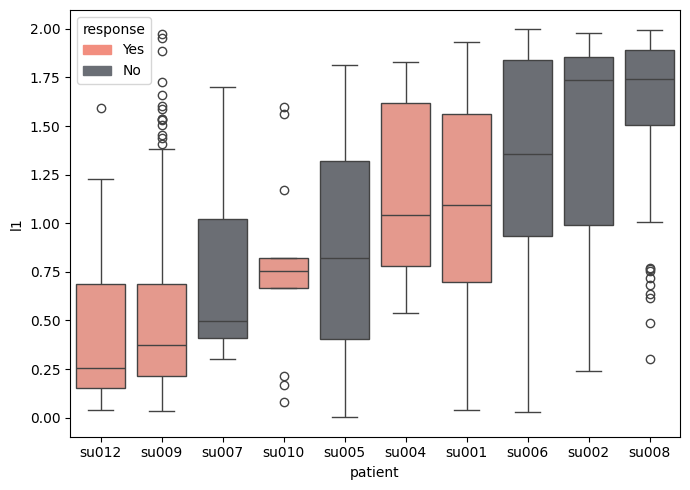

100%|██████████| 11/11 [00:01<00:00,  7.25it/s]


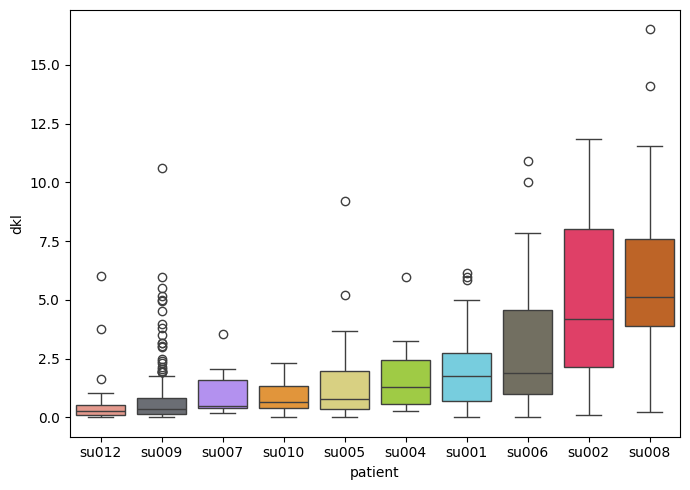

  0%|          | 0/11 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:01<00:00,  6.71it/s]


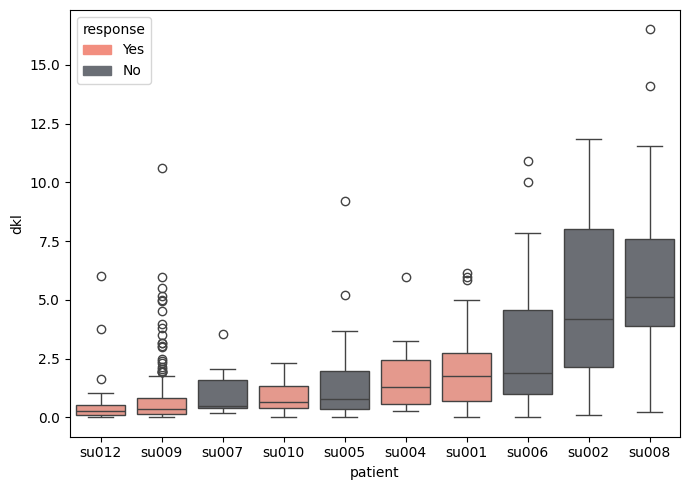

Text(0.5, 1.0, 'su008')

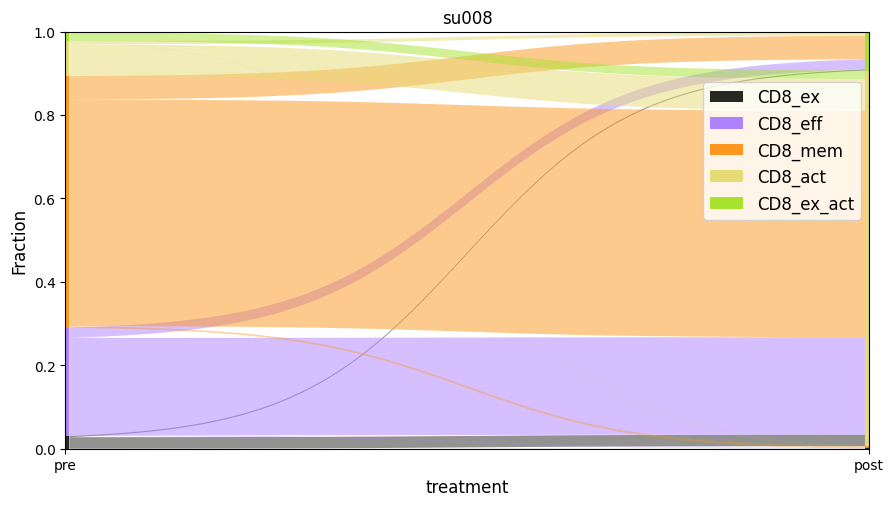

Text(0.5, 1.0, 'su002')

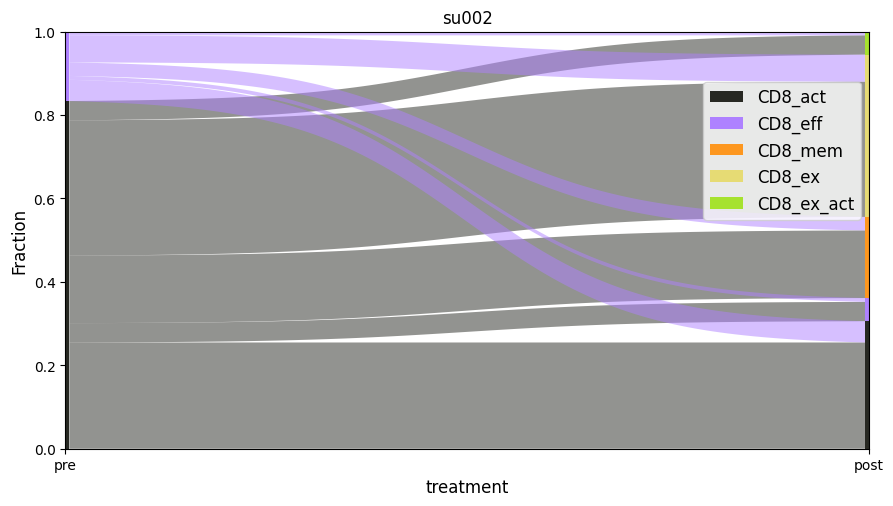

100%|██████████| 2/2 [00:01<00:00,  1.14it/s]


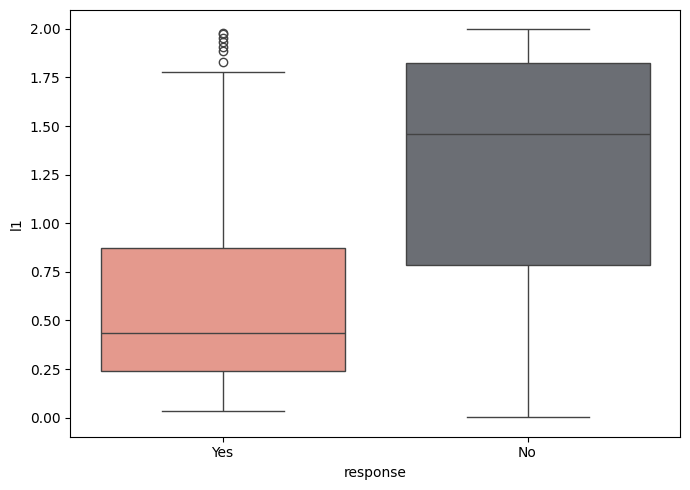

<Axes: title={'center': 'Clonality'}, xlabel='Phenotype', ylabel='Clonality'>

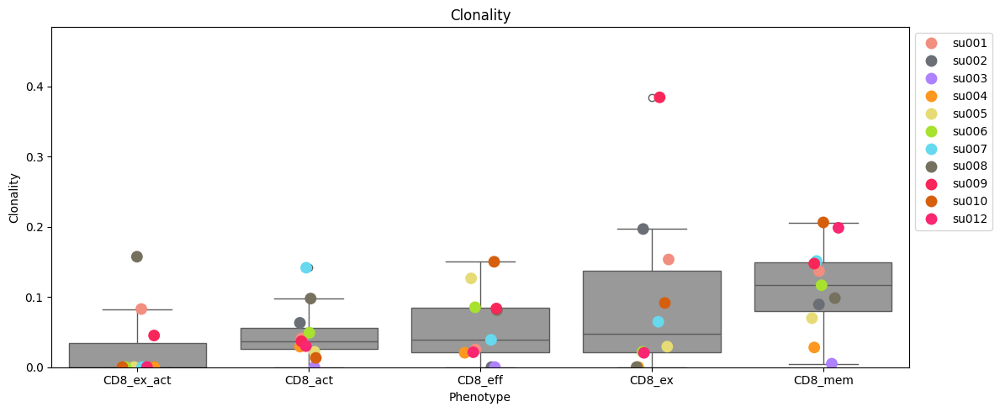

100%|██████████| 2/2 [00:01<00:00,  1.17it/s]


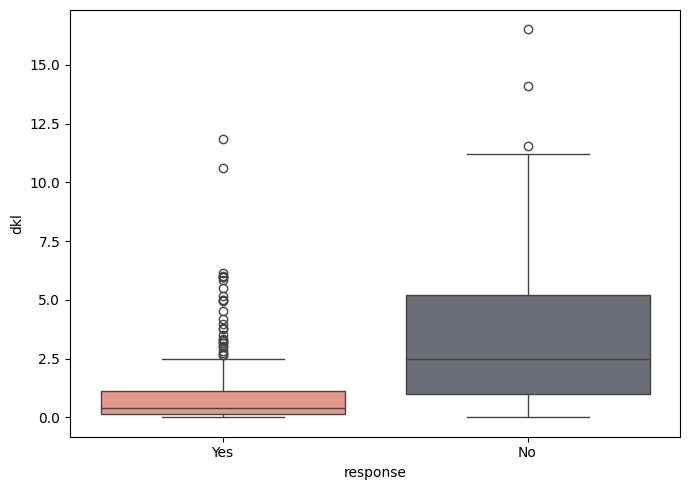

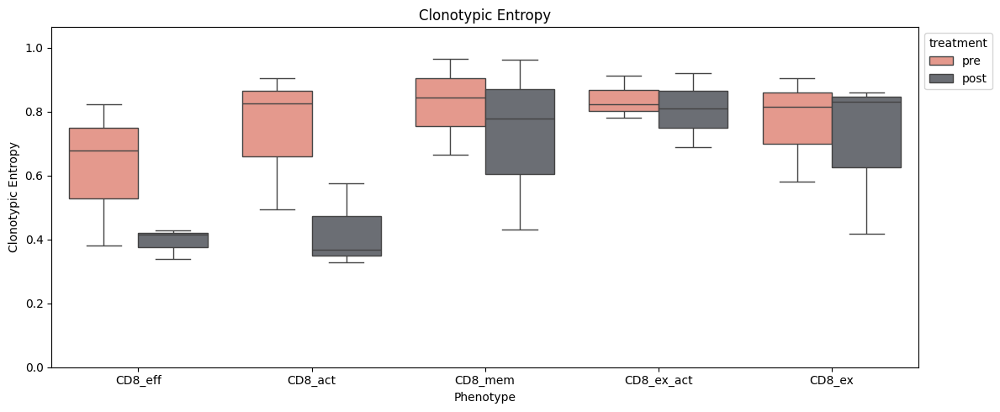

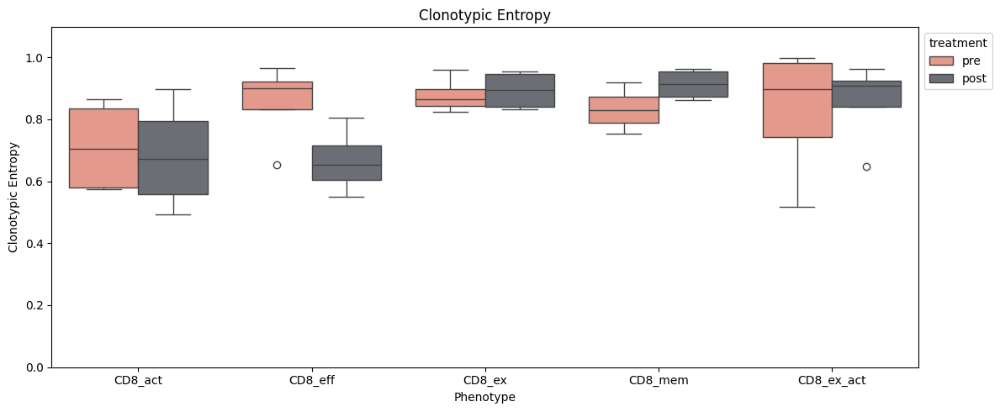

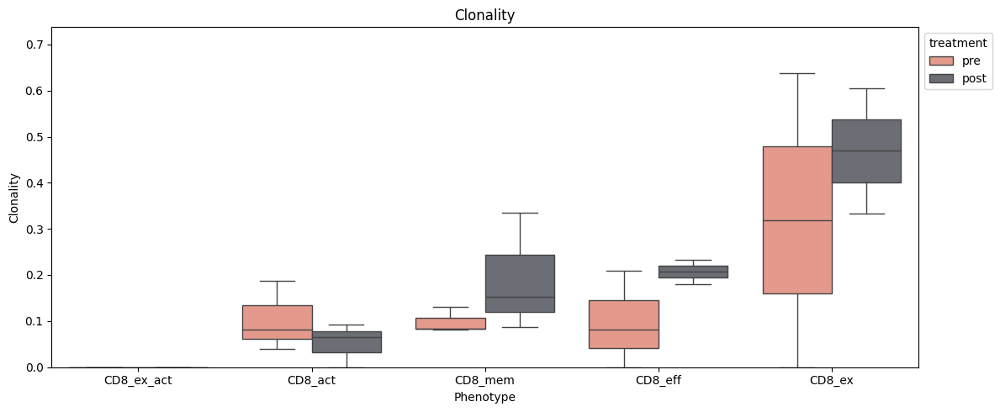

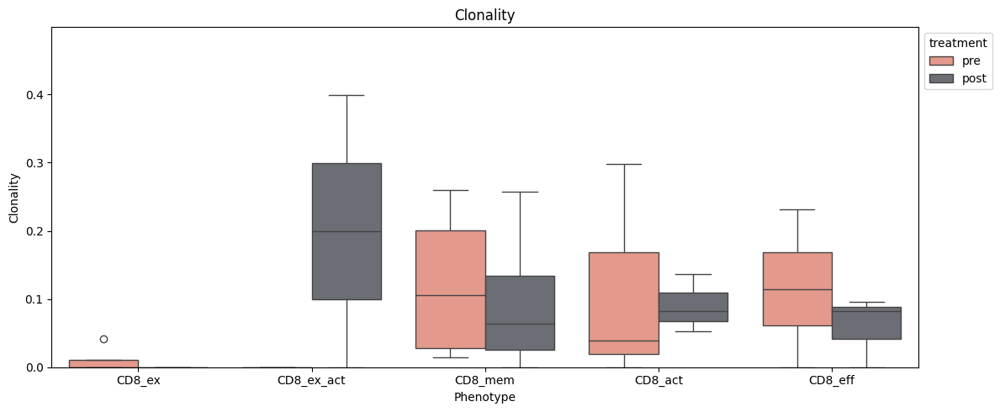

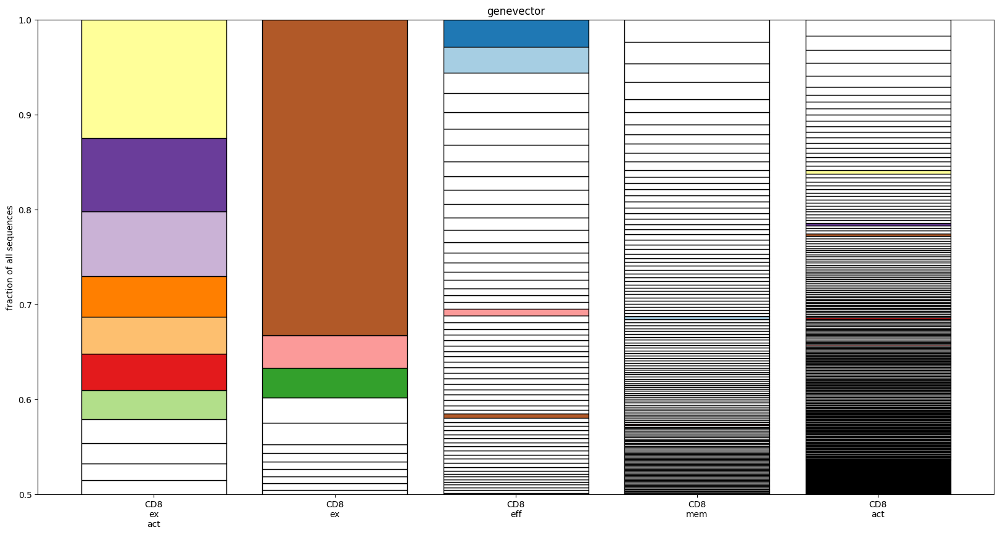

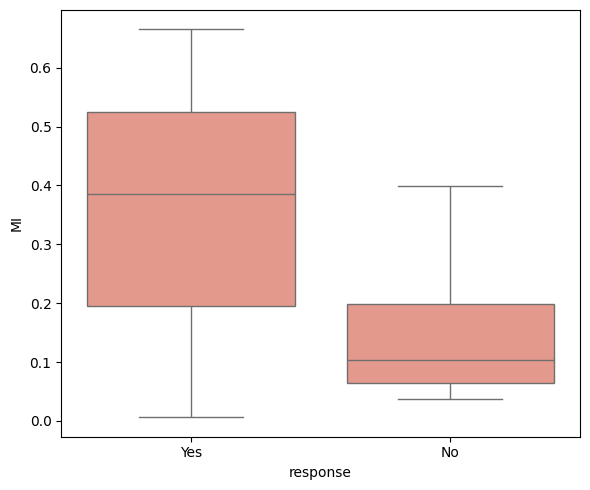

,TCR,Entropy,Response,Sizes
0,CAAGSGLSSPGELFF,3.461165,Yes,1
1,CAARGRVGEKLFF,3.049198,No,1
2,CAARREGTGELFF,3.947209,No,2
3,CACQGFLEETQYF,4.166406,No,2
4,CAGAAERAGADTQYF,4.470606,No,1
...,...,...,...,...
3694,CSVVSGASNEQYF,0.000000,Yes,1
3695,CSVVYYKGGVYGYTF,0.000000,No,1
3696,CSVWGLAGYNEQFF,0.000000,No,1
3697,CSVYLSRAHEQYF,0.000000,No,1


,TCR,Entropy,Response,Sizes,Patient
0,CASKGVAGGPPPYNEQFF,0.401622,Yes,1,su004
1,CASNLFRGTYNEQFF,0.937973,Yes,2,su004
2,CASRGNGGRASGELFF,0.004530,Yes,1,su004
3,CASRPSGTGNEQFF,0.009038,Yes,1,su004
4,CASRPSPTGNSPLHF,0.013405,Yes,1,su004
...,...,...,...,...,...
3701,CSVEDHNYGYTF,0.442874,Yes,1,su001
3702,CSVETGGRNTEAFF,0.444874,Yes,1,su001
3703,CSVFLRGLNTEAFF,0.603298,Yes,1,su001
3704,CSVPTPQGSWYGYTF,0.389306,Yes,6,su001


,TCR,Entropy,Response,Sizes,Patient


<Axes: >

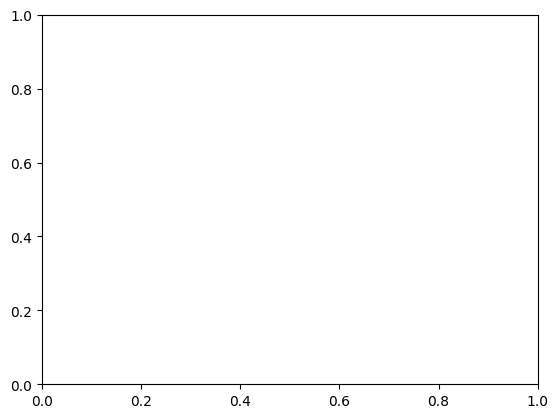

<Axes: xlabel='Response', ylabel='count'>

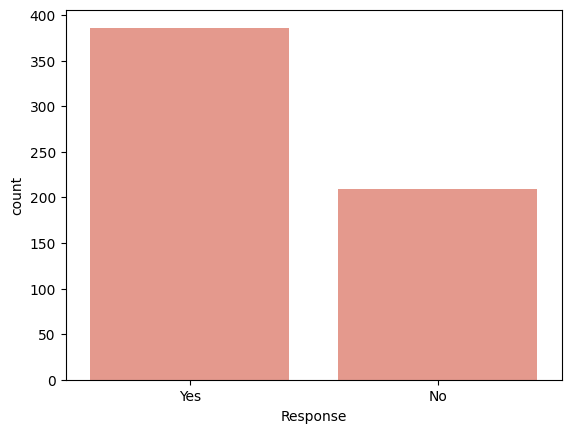

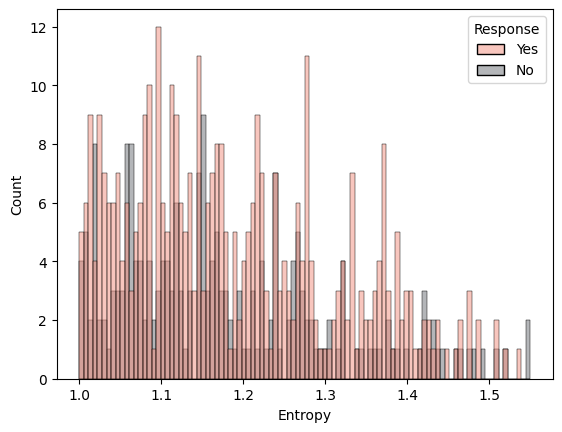

<Axes: xlabel='Response', ylabel='Entropy'>

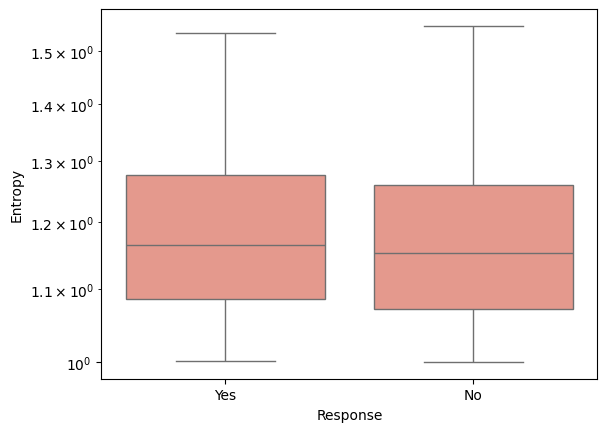

<Axes: xlabel='Entropy', ylabel='Sizes'>

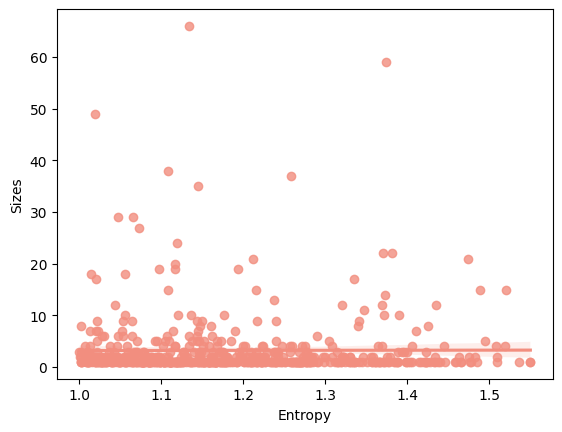

1.5363418205144457

1.550274246560155

,TCR,Entropy,Response,Sizes,Patient
159,CASSLIGVSSYNEQFF,1.237382,Yes,13,su012
170,CASSPARNTEAFF,1.097444,Yes,19,su012
473,CSVAGTSVYNEQFF,1.056286,No,18,su005
492,CAISGRGGGAEAFF,1.215637,Yes,15,su009
531,CASQEALGYEQFF,1.014170,Yes,18,su009
650,CASSGGANSGNTIYF,1.020666,Yes,17,su009
697,CASSLAGTSPSNEQFF,1.072701,Yes,27,su009
790,CASSLQRGRTDTQYF,1.043432,Yes,12,su009
833,CASSLVWAKGLFF,1.211845,Yes,21,su009
872,CASSPLSSLTEAFF,1.116460,Yes,19,su009


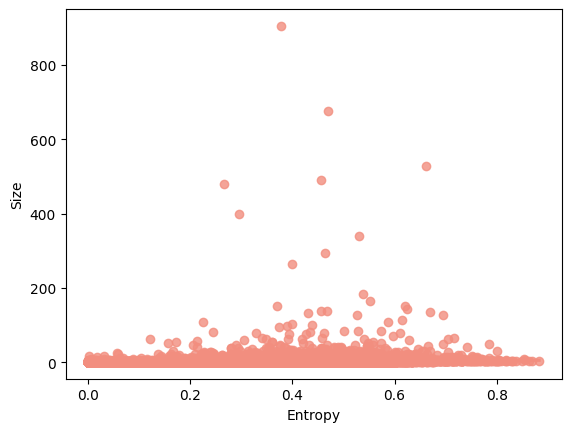

In [159]:

size_to_entropy(adata)